# <center>Anomaly Detection with CNNs for Industrial Surface Inspection<br><br>Tareq Tayeh's Replication</center>
Staar, B., Lütjen, M., & Freitag, M. (2019). Anomaly detection with convolutional neural networks for industrial surface inspection. Procedia CIRP, 79, 484-489. doi: 10.1016/j.procir.2019.02.123

## Paper Abstract
Over the recent years, Convolutional Neural Networks (CNN) have become the primary choice for many image-processing problems.
Regarding industrial applications, they are hence especially interesting for automated optical quality inspection. However, with well-optimized processes, it is often not possible to obtain a sufficiently large set of defective samples for CNN-based classification and the training objective shifts from defect classification to anomaly detection. Here, we approach this problem with deep metric learning using triplet networks. Our evaluation shows promising results that even translate to novel defect classes, which were not part of the training data.

## Paper Approach
Deep Metric Learning using Triplet Networks.
- Utilizes Deep Neural Networks in CNNs
- Networks trained to explicitly learn a similarity metric for surface textures
- Utilizes a Triplet Network Architecture

## Datasets
1) Kyleberg Texture Dataset v1.0 <br>
[Kylberg G. The Kylberg Texture Dataset v. 1.0, Centre for Image Analysis, Swedish University of Agricultural Sciences and Uppsala University, External report (Blue series) No. 35. Available online at: http://www.cb.uu.se/~gustaf/texture/]
    - 28 Texture Classes, each with 160 grayscale images. [All used for training]

2) DAGM Dataset<br>
[Weakly Supervised Learning for Industrial Optical Inspection. 29th Annual Symposium of the German Association for Pattern Recognition. https://resources.mpi-inf.mpg.de/conference/dagm/2007/prizes.html ]<br>
    - .
    Public Dataset:
    - 6 Texture Classes, each with 1000 non-defective & 150 defective samples. [500 non-defective->training. Rest->testing]
    Competition Dataset:
    - 4 Competition Texture Classes, each with 2000 non-defective & 300 defective samples. [All used for testing]

3) CIFAR100 Dataset <br>
[Krizhevsky A, Hinton G. Learning multiple layers of features from tiny images. Technical report, University of Toronto 2009; 1.4:7-67] 
    - 100 Object Classes, each with 600 samples. [All used for training]

## How this Project Notebook is Organized
**Data Pre-Processing**
1. Importing Essential Libraries
2. Creating Classes + Defining Functions + Global Values
3. Kyleberg Texture Dataset: Reading & Processing Dataset
4. Kyleberg Texture Dataset: Explatory Data Analysis
5. Kyleberg Texture Dataset: Further Data Pre-Processing
6. DAGM Public Dataset: Reading & Processing Dataset
7. DAGM Public Dataset: Explatory Data Analysis
8. DAGM Public Dataset: Further Data Pre-Processing
9. DAGM Competition Dataset: Reading & Processing Dataset
10. DAGM Competition Dataset: Explatory Data Analysis
11. DAGM Competition Dataset: Further Data Pre-Processing
12. CIFAR100 Dataset: Reading & Processing Dataset
13. CIFAR100 Dataset: Explatory Data Analysis
14. CIFAR100 Dataset: Further Data Pre-Processing
15. Randomly Resizing Input Images
16. 32x32 Patches Pixel Sampling
17. Artificially Corrupt Images with Gaussian Noise


**Model Building and Triplets Preparing**
18. Building the Residual Block
19. Building the Residual-Based CNN
20. Building Siamese/Triplet Network Model
21. Preparing Triplets


**Model Training**
22. Training the Residual-Based CNN
23. Training Prototype Model

**Model Evaluations**
24. Testing Model

**Conclusion & Next Steps**
<br><br>
\------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### 1. Importing Essential Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import math
import pandas as pd
import os
import cv2
import tensorflow as tf
import pydotplus as pydot
import skimage
import pickle

from glob import glob
from PIL import Image
from matplotlib import pyplot
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score

import keras
import keras.backend as K
from keras import layers
from keras.datasets import cifar100
from keras.utils.np_utils import to_categorical
from keras.utils.vis_utils import model_to_dot, plot_model
from keras.models import Model, model_from_json, load_model
from keras.layers import Input, Conv2D, Cropping2D, MaxPool2D, Lambda, Concatenate, Dense
from keras.losses import MeanAbsoluteError, MeanSquaredError
from keras.optimizers import Adam
from keras.initializers import glorot_uniform

#To see the value of multiple statements at once.
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

Using TensorFlow backend.


In [2]:
print(tf.__version__)

2.1.0


In [3]:
physical_devices = tf.config.experimental.list_physical_devices("GPU")
print(physical_devices)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Num GPUs Available:  1


In [4]:
tf.config.experimental.set_memory_growth(physical_devices[0], True)

### 2. Creating Classes + Defining Functions + Global Values

##### Global Values

In [5]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1)) #Initializing and setting minmaxscaler range for normalization
width = 512 #Width value to be applied across all images pixel resolutions
height = 512 #Height value to be applied across all images pixel resolutions

##### Function to normalize all training images to values between -1 and 1

In [6]:
def normalize_train_images(image_array):
    image_array_normalized = min_max_scaler.fit_transform(image_array.reshape(image_array.shape[0], 
                                                                                   image_array.shape[1] * 
                                                                                   image_array.shape[2]))
    image_array_normalized = image_array_normalized.reshape(image_array.shape)
    #print(image_array_normalized)
    return image_array_normalized

##### Function to normalize all testing images to values between -1 and 1 using training min max scalar value

In [7]:
def normalize_test_images(image_array):
    image_array_normalized = min_max_scaler.transform(image_array.reshape(image_array.shape[0], 
                                                                                   image_array.shape[1] * 
                                                                                   image_array.shape[2]))
    image_array_normalized = image_array_normalized.reshape(image_array.shape)
    #print(image_array_normalized)
    return image_array_normalized

##### Function to perform one-hot encoding

In [8]:
def one_hot_encoding(y_array):
    print("Total Number of Classes: " + str(len(np.unique(y_array))) + "\n")
    y_array_encoded = to_categorical(y_array, num_classes = len(np.unique(y_array)))
    print(y_array_encoded)
    return y_array_encoded

##### Function to show off a few sample images

In [9]:
def show_sample_images(df, label, class_num):
    n_samples = 5
    fig, m_axs = plt.subplots(class_num, n_samples, figsize = (4*n_samples, 3*class_num))
    for n_axs, (type_name, type_rows) in zip(m_axs, 
                                             df.sort_values([str(label)]).groupby(str(label))):
        n_axs[0].set_title(type_name)
        for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=2018).iterrows()):
            c_ax.imshow(c_row['image'])
            c_ax.imshow(c_row['image'], cmap="gray")
            c_ax.axis('off')

##### Function to resize images

In [10]:
def resize_images(array, dim):
    array_resized = np.zeros((len(array), dim[0], dim[1]))
    for i in range(array.shape[0]):
        array_resized[i] = cv2.resize(array[i], dim, interpolation=cv2.INTER_AREA)
    return array_resized

##### Function to deterministically shuffle an array

In [11]:
def shuffle_det(array):
    array_shuffled = np.copy(array)
    np.random.seed(0)
    np.random.shuffle(array_shuffled)
    return array_shuffled

##### Functions to add Gaussian Noise to images with zero mean and unit standard deviation

In [12]:
def add_gaussian_noise(array, num_one, num_two, num_three, num_four):
    array_gaussian_noise = np.zeros(array.shape)
    for i in range(array.shape[0]):
        for j in range(array.shape[1]):
            if (num_one <= i < num_two) & (num_three <= j < num_four):
                array_gaussian_noise[i][j] = skimage.util.random_noise(array[i][j], mode="gaussian",mean = 0, var=(array[i].std() ** 2))
            else:
                array_gaussian_noise[i][j] = array[i][j]
    return array_gaussian_noise

In [13]:
def add_gaussian_noise_patches(array):
    #g_patch_size = 8
    g_patch_size = 14
    random_index = np.random.choice((32-g_patch_size), 2, replace=False)
    patch_gaussian = add_gaussian_noise(array, random_index[0], random_index[0] + g_patch_size, random_index[1], random_index[1] + g_patch_size)
    return patch_gaussian

In [14]:
def add_gaussian_noise_loop(array):
    array_gaussian_noise = []
    
    for i in range(array.shape[0]):
        array_gaussian_noise.extend(add_gaussian_noise_patches(array[i]))
    
    array_gaussian_noise = np.asarray(array_gaussian_noise)
    array_gaussian_noise = np.reshape(array_gaussian_noise, array.shape)
    return array_gaussian_noise

##### Function to randomly extract patches from images

In [15]:
from sklearn.feature_extraction import image

#def extract_patches(x_array, x_array_gaussian_noise,y_array, num_patches):
def extract_patches(x_array, y_array, num_patches):
    x_array_patches = []
    #x_array_gaussian_noise_patches = []
    y_array_patches = []
    
    print("\nImage Resolutions Shape: " + str(x_array.shape))
    print("Number of Patches to be extracted: " + str(num_patches))
    
    for i in range(y_array.shape[0]):
        normal_patches = image.extract_patches_2d(x_array[i], (32, 32), max_patches = num_patches, random_state = 42)
        #gaussian_patches = image.extract_patches_2d(x_array_gaussian_noise[i], (32, 32), max_patches = num_patches, random_state = 42)
        
        x_array_patches.extend(normal_patches) #Add patches from Normal Image to list
        #x_array_gaussian_noise_patches.extend(gaussian_patches) #Add patches from Gaussian Noise Image to list

        #Creating the new patch classes [total = num_patches * num_classes]
        for j in range(num_patches):
            if j == 0: counter = 0
            temp_list = [num_patches*y_array[i] + counter]
            y_array_patches.extend(temp_list)
            counter += 1
    
    x_array_patches = np.asarray(x_array_patches)
    print("Normal Images Patches Shape: " + str(x_array_patches.shape))

#     x_array_gaussian_noise_patches = np.asarray(x_array_gaussian_noise_patches)
#     print("Gaussian Noise Images Patches Shape: " +  str(x_array_gaussian_noise_patches.shape))

    y_array_patches = np.asarray(y_array_patches)
    print("New Patch Classes Shape: " +  str(y_array_patches.shape))
    
    print("Number of New Unique Patch Classes Created: " + str(len(np.unique(y_array_patches))))
    
    #return x_array_patches, x_array_gaussian_noise_patches, y_array_patches
    return x_array_patches, y_array_patches

##### Function to perform one-hot decoding

In [16]:
def one_hot_decoding(array):

    array_decoded = []
    
    for i in range(array.shape[0]):
        datum = array[i]
        decoded_datum = np.argmax(array[i])
        temp_list = [decoded_datum]
        array_decoded.extend(temp_list)

    array_decoded = np.asarray(array_decoded)
    print("New Decoded Shape: " +  str(array_decoded.shape))
    return array_decoded

##### Function to generate data Triplets

In [17]:
#https://github.com/eroj333/learning-cv-ml/blob/master/SNN/Offline%20Triplet%20Mining.ipynb

def generate_triplets(dataset, label, classes, sample_per_class, gaussian_dataset): 
  x, y = None, None
  for i in range(classes):
    pos_indices = np.argwhere(label == i)[:,0]
    neg_indices = np.argwhere(label != i)[:,0]

    # print("pos indices: {}, neg_indices: {}".format(pos_indices.shape, neg_indices.shape))
    np.random.seed(0)
#     choice_anchor = np.random.choice(pos_indices.shape[0], sample_per_class, replace=False) # Replace = False ensures unique values
#     choice_anchor = pos_indices[choice_anchor]
#     sub_x_anc = dataset[choice_anchor]

#     choice_pos = np.random.choice(pos_indices.shape[0], sample_per_class, replace=False)
#     choice_pos = pos_indices[choice_pos]
#     sub_x_pos = dataset[choice_pos]

    choice_pos = np.random.choice(pos_indices.shape[0], sample_per_class, replace=False) # Replace = False ensures unique values
    choice_pos = pos_indices[choice_pos]
    sub_x_pos = dataset[choice_pos]

    choice_anchor = np.random.choice(pos_indices.shape[0], sample_per_class, replace=False)
    choice_anchor = pos_indices[choice_anchor]
    sub_x_anc = dataset[choice_anchor]

    if(gaussian_dataset.any() == False):
        choice_neg = np.random.choice(neg_indices.shape[0], sample_per_class, replace=False)
        choice_neg = neg_indices[choice_neg]
        sub_x_neg = dataset[choice_neg]
    else:
        np.random.seed(0)
        choice_neg = np.random.choice(pos_indices.shape[0], sample_per_class, replace=False)
        choice_neg = pos_indices[choice_neg]
        sub_x_neg = gaussian_dataset[choice_neg]

        
    if(x is None):
      x = [(sub_x_anc), (sub_x_pos), (sub_x_neg)]
      y = [label[choice_anchor], label[choice_pos], label[choice_neg]]
    else:
      x[0] = np.vstack((x[0], (sub_x_anc)))
      x[1] = np.vstack((x[1], (sub_x_pos)))
      x[2] = np.vstack((x[2], (sub_x_neg)))

      y[0] = np.hstack((y[0].flatten(), label[choice_anchor].flatten()))
      y[1] = np.hstack((y[1].flatten(), label[choice_pos].flatten()))
      y[2] = np.hstack((y[2].flatten(), label[choice_neg].flatten()))
    
  return x, y

##### Function to visualize Triplet data

In [18]:
#https://github.com/eroj333/learning-cv-ml/blob/master/SNN/Offline%20Triplet%20Mining.ipynb

def visualize_triplet_data(data, n):
  n = min(len(data[0]), n)
  random_choices = np.random.choice(len(data[0]),n, replace=False)
  fig, ax = plt.subplots(n, 3,figsize=(10,40))
  anc, pos, neg = data
  for i,ch in enumerate(random_choices):
    ax[i, 0].imshow(np.squeeze(anc[ch] ), cmap="gray")
    ax[i, 1].imshow(np.squeeze(pos[ch] ), cmap="gray")
    ax[i, 2].imshow(np.squeeze(neg[ch] ), cmap="gray")
    

    ax[i, 0].set_axis_off()
    ax[i, 1].set_axis_off()
    ax[i, 2].set_axis_off()

##### Function that saves variable values locally

In [ ]:
def save_variables(lst, name):
    f = open('../SavedObj/' + name + '.pckl', 'wb')
    pickle.dump(lst, f)
    f.close()

##### Function that loads values from local to variables

In [ ]:
def load_variables(name):
    f = open('../SavedObj/' + name + '.pckl', 'rb')
    var = pickle.load(f)
    f.close()
    return var

##### Function that plots the model history

In [161]:
def plot_history_loss(history):
    plt.plot(history.history["loss"])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='upper left')
    plt.show()

##### Function that collects all images of a specified class

In [19]:
def split_classes(x_array, y_array, class_num):
    prototype = []
    for i in range(y_array.shape[0]):
        if y_array[i] == class_num:
            prototype.append(x_array[i])
    prototype = np.asarray(prototype)
    prototype = np.expand_dims(prototype, 3)
    print(prototype.shape)
    return prototype

##### Function that calculates the mean and max of a prediction

In [20]:
def prototype_mean_and_max(prediction):
    mean = np.mean(prediction, axis = 0)
    print("Mean Shape: " + str(mean.shape))
    print("Max Mean Value: " + str(np.max(mean)))
    return mean

##### Function that calculates the mean and max of a prediction for non defective and defective images

In [21]:
def testing_mean_and_max(prediction_non_defect, prediction_defect):
    mean_non_defect = np.mean(prediction_non_defect, axis = 0)
    mean_defect = np.mean(prediction_defect, axis = 0)
    print("Max Mean Non Defect: " + str(np.max(mean_non_defect)))
    print("Max Mean Defect: " + str(np.max(mean_defect)))
    return mean_non_defect, mean_defect

##### Function that calculates elementwise Euclidean distance between two inputs

In [22]:
def elementwise_cdist(a,b):
    d = a-b
    #print(d)
    #print("Max Euclidean Distance: " + str(np.max(d)))
    return np.sqrt(np.einsum('ijk,ijk->ij',d,d))

##### Function that calculates and plots the auc score

In [23]:
def auc_curve_and_score(prototype_mean, prediction_non_defect, prediction_defect, threshold):
    true_negative = 0
    false_negative = 0
    true_positive = 0
    false_positive = 0
    y_true = []
    y_pred = []
    
    #for i in range(prediction_defect.shape[0]):
    for i in range(prediction_non_defect.shape[0]):
        euclidean_distance_non_defect_example = elementwise_cdist(prototype_mean, prediction_non_defect[i])
        y_pred.append(0)
        if np.max(euclidean_distance_non_defect_example) < threshold:
            true_negative += 1
            y_true.append(0)
        else:
            false_negative += 1
            y_true.append(1)
    
    for i in range(prediction_defect.shape[0]):
        euclidean_distance_defect_example = elementwise_cdist(prototype_mean, prediction_defect[i])
        y_pred.append(1)
        if np.max(euclidean_distance_defect_example) > threshold:
            true_positive += 1
            y_true.append(1)
        else:
            false_positive += 1
            y_true.append(0)
    
    print("True Negatives: " + str(true_negative))
    print("False Negatives: " + str(false_negative))
    print("True Positives: " + str(true_positive))
    print("False Positives: " + str(false_positive))
    
    #Also known as sensitivity
    true_positive_rate = true_positive / (true_positive + false_negative)# * (prediction_defect.shape[0]/prediction_non_defect.shape[0])))
    print("\nTrue Positive Rate: " + str(true_positive_rate))

    #Also known as specificity
    false_positive_rate = false_positive / (false_positive + true_negative)# * (prediction_defect.shape[0]/prediction_non_defect.shape[0])))
    print("False Positive Rate: " + str(false_positive_rate))
    
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    print("\nauc score: " + str(auc))
    
    pyplot.plot(fpr, tpr, marker='.')
    # axis labels
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show()

##### CIFAR100 Classes

In [24]:
cifar_classes = [
  'apple',
  'aquarium_fish',
  'baby',
  'bear',
  'beaver',
  'bed',
  'bee',
  'beetle',
  'bicycle',
  'bottle',
  'bowl',
  'boy',
  'bridge',
  'bus',
  'butterfly',
  'camel',
  'can',
  'castle',
  'caterpillar',
  'cattle',
  'chair',
  'chimpanzee',
  'clock',
  'cloud',
  'cockroach',
  'couch',
  'crab',
  'crocodile',
  'cup',
  'dinosaur',
  'dolphin',
  'elephant',
  'flatfish',
  'forest',
  'fox',
  'girl',
  'hamster',
  'house',
  'kangaroo',
  'computer_keyboard',
  'lamp',
  'lawn_mower',
  'leopard',
  'lion',
  'lizard',
  'lobster',
  'man',
  'maple_tree',
  'motorcycle',
  'mountain',
  'mouse',
  'mushroom',
  'oak_tree',
  'orange',
  'orchid',
  'otter',
  'palm_tree',
  'pear',
  'pickup_truck',
  'pine_tree',
  'plain',
  'plate',
  'poppy',
  'porcupine',
  'possum',
  'rabbit',
  'raccoon',
  'ray',
  'road',
  'rocket',
  'rose',
  'sea',
  'seal',
  'shark',
  'shrew',
  'skunk',
  'skyscraper',
  'snail',
  'snake',
  'spider',
  'squirrel',
  'streetcar',
  'sunflower',
  'sweet_pepper',
  'table',
  'tank',
  'telephone',
  'television',
  'tiger',
  'tractor',
  'train',
  'trout',
  'tulip',
  'turtle',
  'wardrobe',
  'whale',
  'willow_tree',
  'wolf',
  'woman',
  'worm',
]

### 3. Kyleberg Texture Dataset: Reading & Processing Dataset

Dataset: http://www.cb.uu.se/~gustaf/texture/data/without-rotations-zip/
- All zipped folders were downloaded
- All zipped folders were extracted
- All images were added into 1 folder called `Kyleberg Texture Dataset`

##### Setting Kyleberg Dataset Directory

In [25]:
kyleberg_dir = os.path.join('..', 'data', 'Kylberg Texture Dataset', '*.png')
print(kyleberg_dir)

..\data\Kylberg Texture Dataset\*.png


##### Getting all files in Kyleberg Directory

In [26]:
kyleberg_files = glob(kyleberg_dir)
# for x in range(len(kyleberg_files)):
#     print(kyleberg_files[x])

##### Creating a dataframe with all the files locations

In [27]:
kyleberg_df = pd.DataFrame(data=kyleberg_files, columns=['path'])
kyleberg_df

,path
0,..\data\Kylberg Texture Dataset\blanket1-a-p00...
1,..\data\Kylberg Texture Dataset\blanket1-a-p00...
2,..\data\Kylberg Texture Dataset\blanket1-a-p00...
3,..\data\Kylberg Texture Dataset\blanket1-a-p00...
4,..\data\Kylberg Texture Dataset\blanket1-a-p00...
...,...
4475,..\data\Kylberg Texture Dataset\wall1-d-p036.png
4476,..\data\Kylberg Texture Dataset\wall1-d-p037.png
4477,..\data\Kylberg Texture Dataset\wall1-d-p038.png
4478,..\data\Kylberg Texture Dataset\wall1-d-p039.png


##### Extracting the label associated with each image file

In [28]:
kyleberg_labels = [os.path.split(f.split('/')[-1].split('-')[0])[1] for f in kyleberg_files]
# for x in range(len(kyleberg_labels)):
#     print(kyleberg_labels[x])

##### Adding the label associated with its respective image to the kyleberg dataframe

In [29]:
kyleberg_df['path_labels'] = kyleberg_labels
kyleberg_df

,path,path_labels
0,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1
1,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1
2,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1
3,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1
4,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1
...,...,...
4475,..\data\Kylberg Texture Dataset\wall1-d-p036.png,wall1
4476,..\data\Kylberg Texture Dataset\wall1-d-p037.png,wall1
4477,..\data\Kylberg Texture Dataset\wall1-d-p038.png,wall1
4478,..\data\Kylberg Texture Dataset\wall1-d-p039.png,wall1


##### Adding a unique code to each category for easier processing later on

In [30]:
kyleberg_df['path_labels_code'] = pd.Categorical(kyleberg_df['path_labels']).codes
kyleberg_df

,path,path_labels,path_labels_code
0,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0
1,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0
2,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0
3,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0
4,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0
...,...,...,...
4475,..\data\Kylberg Texture Dataset\wall1-d-p036.png,wall1,27
4476,..\data\Kylberg Texture Dataset\wall1-d-p037.png,wall1,27
4477,..\data\Kylberg Texture Dataset\wall1-d-p038.png,wall1,27
4478,..\data\Kylberg Texture Dataset\wall1-d-p039.png,wall1,27


### 4. Kyleberg Texture Dataset: Explatory Data Analysis

##### Output descriptive statistics about the dataset

In [31]:
kyleberg_df.describe(exclude=[np.number])

,path,path_labels
count,4480,4480
unique,4480,28
top,..\data\Kylberg Texture Dataset\linseeds1-b-p0...,blanket1
freq,1,160


##### Check each attribute's datatype

In [32]:
print(kyleberg_df.dtypes)

path                object
path_labels         object
path_labels_code      int8
dtype: object


##### Check for missing values

In [33]:
kyleberg_df.isnull().sum()

path                0
path_labels         0
path_labels_code    0
dtype: int64

##### Ensuring we got an equal amount of images per category as expected

In [34]:
kyleberg_df['path_labels'].value_counts()

blanket1        160
floor2          160
sesameseeds1    160
stoneslab1      160
floor1          160
sand1           160
stone3          160
grass1          160
blanket2        160
ceiling1        160
pearlsugar1     160
wall1           160
stone2          160
scarf1          160
seat1           160
stone1          160
linseeds1       160
rice2           160
lentils1        160
seat2           160
ceiling2        160
scarf2          160
cushion1        160
oatmeal1        160
screen1         160
canvas1         160
rug1            160
rice1           160
Name: path_labels, dtype: int64

### 5. Kyleberg Texture Dataset: Further Data Pre-Processing

##### Find the width and height of the images

In [35]:
im = Image.open(kyleberg_df["path"][0])
kyleberg_width, kyleberg_height = im.size
print("Width: ", kyleberg_width)
print("Height:", kyleberg_height)

Width:  576
Height: 576


##### Resize images to 512x512 pixel resolutions and add the image pixel values as a new column to the kyleberg dataframe

In [37]:
kyleberg_df['image'] = kyleberg_df['path'].map(lambda x: np.asarray(Image.open(x).resize((int(width), int(height)))))
kyleberg_df

,path,path_labels,path_labels_code,image
0,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0,"[[130, 158, 145, 138, 160, 167, 162, 166, 144,..."
1,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0,"[[136, 107, 105, 101, 108, 113, 118, 126, 123,..."
2,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0,"[[185, 222, 209, 151, 131, 117, 96, 94, 126, 1..."
3,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0,"[[128, 124, 138, 158, 175, 186, 162, 165, 137,..."
4,..\data\Kylberg Texture Dataset\blanket1-a-p00...,blanket1,0,"[[140, 158, 153, 170, 231, 217, 169, 180, 175,..."
...,...,...,...,...
4475,..\data\Kylberg Texture Dataset\wall1-d-p036.png,wall1,27,"[[90, 79, 74, 57, 51, 79, 114, 110, 113, 155, ..."
4476,..\data\Kylberg Texture Dataset\wall1-d-p037.png,wall1,27,"[[78, 101, 90, 81, 81, 104, 172, 196, 200, 196..."
4477,..\data\Kylberg Texture Dataset\wall1-d-p038.png,wall1,27,"[[111, 98, 95, 110, 149, 173, 172, 162, 135, 1..."
4478,..\data\Kylberg Texture Dataset\wall1-d-p039.png,wall1,27,"[[107, 128, 119, 85, 83, 91, 102, 115, 118, 15..."


##### Check the image size distribution

In [38]:
kyleberg_df['image'].map(lambda x: x.shape).value_counts()

(512, 512)    4480
Name: image, dtype: int64

##### Show off a few samples in each texture category

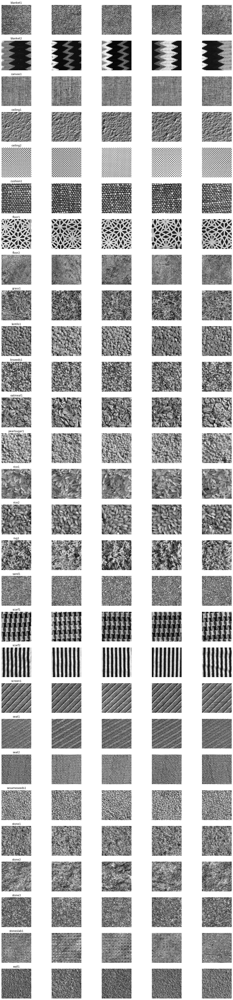

In [39]:
show_sample_images(kyleberg_df, 'path_labels', 28)

##### Features and Target Split

In [40]:
x_kyleberg = kyleberg_df['image']
y_kyleberg = kyleberg_df['path_labels_code']

##### Converting Image lists to a Numpy array

In [41]:
print(x_kyleberg.shape)
x_kyleberg_images = np.asarray(x_kyleberg.tolist())
print(x_kyleberg_images.shape)
#print(x_kyleberg_images)

(4480,)
(4480, 512, 512)


##### Normalizing all features to values between -1 and 1

In [42]:
x_kyleberg_normalized = normalize_train_images(x_kyleberg_images)

##### Converting class labels to a single array
This is done by first encoding the data then decoding it

In [43]:
y_kyleberg_encoded = one_hot_encoding(y_kyleberg)
y_kyleberg_decoded = one_hot_decoding(y_kyleberg_encoded)

Total Number of Classes: 28

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
New Decoded Shape: (4480,)


##### Deleting unneeded objects to free up memory

In [44]:
del kyleberg_dir, kyleberg_files, kyleberg_labels, x_kyleberg, y_kyleberg, x_kyleberg_images, y_kyleberg_encoded, kyleberg_df 

#### <font color ='green'> Our Kyleberg data is now ready to be fed into our networks for training.<br><br> Features: `x_kyleberg_normalized`. Target: `y_kyleberg_decoded`</font>

### 6. DAGM Public Dataset: Reading & Processing Dataset

Dataset: https://resources.mpi-inf.mpg.de/conference/dagm/2007/prizes.html
- All zipped folders were downloaded
- All zipped folders were extracted
- All folders were added into 1 main folder called `DAGM Public`

##### Setting DAGM Public Dataset Directory

In [45]:
dagm_files_dir = os.path.join('..', 'data', 'DAGM Public', '*', '*.png')
print(dagm_files_dir)

..\data\DAGM Public\*\*.png


##### Getting all files in DAGM Public Directory

In [1]:
# dagm_files = glob(dagm_files_dir)
# for x in range(len(dagm_files)):
#     print(dagm_files[x])

##### Creating a dataframe with all the files locations

In [47]:
dagm_public_df = pd.DataFrame(data=dagm_files, columns=['path'])
dagm_public_df

,path
0,..\data\DAGM Public\Class1\1.png
1,..\data\DAGM Public\Class1\10.png
2,..\data\DAGM Public\Class1\100.png
3,..\data\DAGM Public\Class1\1000.png
4,..\data\DAGM Public\Class1\101.png
...,...
6895,..\data\DAGM Public\Class6_def\95.png
6896,..\data\DAGM Public\Class6_def\96.png
6897,..\data\DAGM Public\Class6_def\97.png
6898,..\data\DAGM Public\Class6_def\98.png


##### Extracting the class associated with each image file

In [48]:
dagm_file_classes = [os.path.split(f)[0] for f in dagm_files]
dagm_file_classes = [os.path.split(f)[1] for f in dagm_file_classes]
# for x in range(len(dagm_file_classes)):
#     print(dagm_file_classes[x])

##### Adding the class associated with its respective image to the DAGM Public dataframe

In [49]:
dagm_public_df['class'] = dagm_file_classes
dagm_public_df

,path,class
0,..\data\DAGM Public\Class1\1.png,Class1
1,..\data\DAGM Public\Class1\10.png,Class1
2,..\data\DAGM Public\Class1\100.png,Class1
3,..\data\DAGM Public\Class1\1000.png,Class1
4,..\data\DAGM Public\Class1\101.png,Class1
...,...,...
6895,..\data\DAGM Public\Class6_def\95.png,Class6_def
6896,..\data\DAGM Public\Class6_def\96.png,Class6_def
6897,..\data\DAGM Public\Class6_def\97.png,Class6_def
6898,..\data\DAGM Public\Class6_def\98.png,Class6_def


##### Adding a unique code to each class for easier processing later on

In [50]:
dagm_public_df['class_code'] = pd.Categorical(dagm_public_df['class']).codes
dagm_public_df

,path,class,class_code
0,..\data\DAGM Public\Class1\1.png,Class1,0
1,..\data\DAGM Public\Class1\10.png,Class1,0
2,..\data\DAGM Public\Class1\100.png,Class1,0
3,..\data\DAGM Public\Class1\1000.png,Class1,0
4,..\data\DAGM Public\Class1\101.png,Class1,0
...,...,...,...
6895,..\data\DAGM Public\Class6_def\95.png,Class6_def,11
6896,..\data\DAGM Public\Class6_def\96.png,Class6_def,11
6897,..\data\DAGM Public\Class6_def\97.png,Class6_def,11
6898,..\data\DAGM Public\Class6_def\98.png,Class6_def,11


### 7. DAGM Public Dataset: Explatory Data Analysis

##### Output descriptive statistics about the dataset

In [51]:
dagm_public_df.describe(exclude=[np.number])

,path,class
count,6900,6900
unique,6900,12
top,..\data\DAGM Public\Class1\495.png,Class5
freq,1,1000


##### Check each attribute's datatype

In [52]:
print(dagm_public_df.dtypes)

path          object
class         object
class_code      int8
dtype: object


##### Check for missing values

In [53]:
dagm_public_df.isnull().sum()

path          0
class         0
class_code    0
dtype: int64

##### Ensuring we got an equal amount of images per defective and non-defective classes as expected

In [54]:
dagm_public_df['class'].value_counts()

Class5        1000
Class6        1000
Class3        1000
Class2        1000
Class4        1000
Class1        1000
Class6_def     150
Class5_def     150
Class4_def     150
Class2_def     150
Class3_def     150
Class1_def     150
Name: class, dtype: int64

### 8. DAGM Public Dataset: Further Data Pre-Processing

##### Find the width and height of the images

In [55]:
im = Image.open(dagm_public_df["path"][0])
dagm_public_width, dagm_public_height = im.size
print("Width: ", dagm_public_width)
print("Height:", dagm_public_height)

Width:  512
Height: 512


Images already 512 x 512 pixel resolutions as we want them to be.

##### Add the image pixel values as a new column to the DAGM Public dataframe

In [56]:
dagm_public_df['image'] = dagm_public_df['path'].map(lambda x: np.asarray(Image.open(x)))
dagm_public_df
# dagm_public_df['image'] = dagm_public_df['path'].map(lambda x: np.asarray(Image.open(x).resize((int(width), int(height)))))
# dagm_public_df

,path,class,class_code,image
0,..\data\DAGM Public\Class1\1.png,Class1,0,"[[77, 107, 175, 96, 89, 142, 113, 131, 132, 13..."
1,..\data\DAGM Public\Class1\10.png,Class1,0,"[[169, 67, 162, 101, 130, 134, 199, 174, 138, ..."
2,..\data\DAGM Public\Class1\100.png,Class1,0,"[[56, 113, 81, 105, 118, 26, 111, 33, 176, 186..."
3,..\data\DAGM Public\Class1\1000.png,Class1,0,"[[49, 61, 26, 108, 51, 70, 45, 89, 60, 108, 90..."
4,..\data\DAGM Public\Class1\101.png,Class1,0,"[[27, 92, 8, 87, 116, 85, 76, 123, 108, 78, 18..."
...,...,...,...,...
6895,..\data\DAGM Public\Class6_def\95.png,Class6_def,11,"[[171, 146, 100, 160, 202, 208, 224, 238, 238,..."
6896,..\data\DAGM Public\Class6_def\96.png,Class6_def,11,"[[229, 170, 106, 95, 72, 129, 207, 236, 247, 2..."
6897,..\data\DAGM Public\Class6_def\97.png,Class6_def,11,"[[23, 60, 66, 78, 48, 21, 11, 15, 58, 50, 27, ..."
6898,..\data\DAGM Public\Class6_def\98.png,Class6_def,11,"[[93, 92, 70, 145, 129, 112, 72, 69, 57, 74, 1..."


##### Check the image size distribution

In [57]:
dagm_public_df['image'].map(lambda x: x.shape).value_counts()

(512, 512)    6900
Name: image, dtype: int64

##### Show off a few samples in each texture category

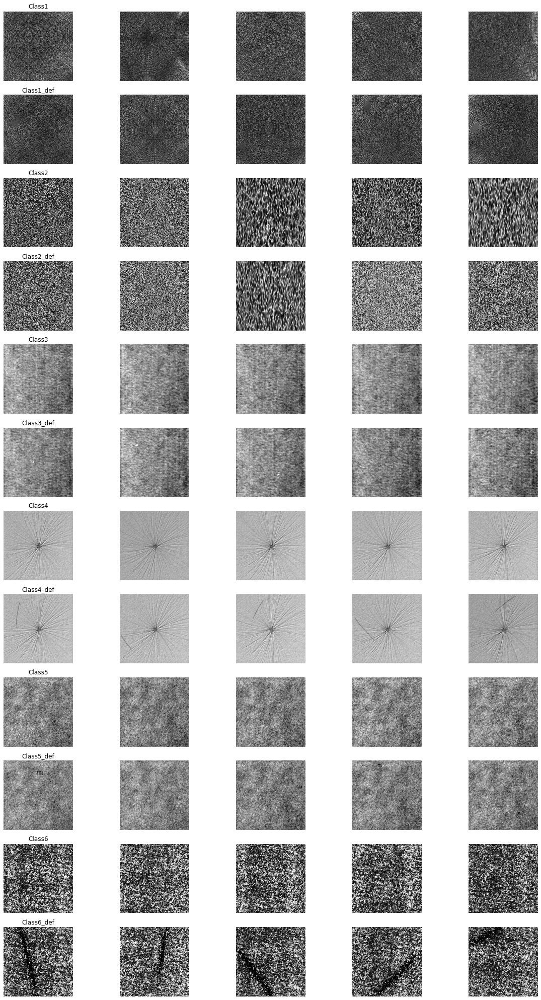

In [58]:
show_sample_images(dagm_public_df, 'class', 12)

##### Splitting Dataframe into 2 separate Non-Defective and Defective Samples Dataframes

In [59]:
#Non-Defective
dagm_public_non_defective_df = dagm_public_df.loc[(dagm_public_df['class_code'] == 0) | 
                                              (dagm_public_df['class_code'] == 2) | 
                                              (dagm_public_df['class_code'] == 4) | 
                                              (dagm_public_df['class_code'] == 6) | 
                                              (dagm_public_df['class_code'] == 8) | 
                                              (dagm_public_df['class_code'] == 10)]
dagm_public_non_defective_df

#Defective
dagm_public_defective_df = dagm_public_df.loc[(dagm_public_df['class_code'] == 1) | 
                                              (dagm_public_df['class_code'] == 3) | 
                                              (dagm_public_df['class_code'] == 5) | 
                                              (dagm_public_df['class_code'] == 7) | 
                                              (dagm_public_df['class_code'] == 9) | 
                                              (dagm_public_df['class_code'] == 11)]
dagm_public_defective_df

,path,class,class_code,image
0,..\data\DAGM Public\Class1\1.png,Class1,0,"[[77, 107, 175, 96, 89, 142, 113, 131, 132, 13..."
1,..\data\DAGM Public\Class1\10.png,Class1,0,"[[169, 67, 162, 101, 130, 134, 199, 174, 138, ..."
2,..\data\DAGM Public\Class1\100.png,Class1,0,"[[56, 113, 81, 105, 118, 26, 111, 33, 176, 186..."
3,..\data\DAGM Public\Class1\1000.png,Class1,0,"[[49, 61, 26, 108, 51, 70, 45, 89, 60, 108, 90..."
4,..\data\DAGM Public\Class1\101.png,Class1,0,"[[27, 92, 8, 87, 116, 85, 76, 123, 108, 78, 18..."
...,...,...,...,...
6745,..\data\DAGM Public\Class6\995.png,Class6,10,"[[181, 208, 240, 246, 241, 232, 248, 183, 110,..."
6746,..\data\DAGM Public\Class6\996.png,Class6,10,"[[176, 188, 189, 144, 150, 153, 168, 88, 78, 1..."
6747,..\data\DAGM Public\Class6\997.png,Class6,10,"[[136, 63, 24, 32, 8, 16, 22, 74, 152, 220, 23..."
6748,..\data\DAGM Public\Class6\998.png,Class6,10,"[[173, 88, 70, 53, 52, 81, 68, 85, 120, 85, 39..."


,path,class,class_code,image
1000,..\data\DAGM Public\Class1_def\1.png,Class1_def,1,"[[64, 98, 66, 171, 211, 195, 67, 58, 80, 109, ..."
1001,..\data\DAGM Public\Class1_def\10.png,Class1_def,1,"[[98, 97, 107, 81, 70, 92, 42, 57, 85, 87, 52,..."
1002,..\data\DAGM Public\Class1_def\100.png,Class1_def,1,"[[66, 64, 117, 106, 97, 165, 87, 63, 115, 99, ..."
1003,..\data\DAGM Public\Class1_def\101.png,Class1_def,1,"[[94, 42, 23, 88, 58, 46, 40, 84, 101, 130, 62..."
1004,..\data\DAGM Public\Class1_def\102.png,Class1_def,1,"[[110, 152, 228, 111, 44, 52, 70, 74, 13, 42, ..."
...,...,...,...,...
6895,..\data\DAGM Public\Class6_def\95.png,Class6_def,11,"[[171, 146, 100, 160, 202, 208, 224, 238, 238,..."
6896,..\data\DAGM Public\Class6_def\96.png,Class6_def,11,"[[229, 170, 106, 95, 72, 129, 207, 236, 247, 2..."
6897,..\data\DAGM Public\Class6_def\97.png,Class6_def,11,"[[23, 60, 66, 78, 48, 21, 11, 15, 58, 50, 27, ..."
6898,..\data\DAGM Public\Class6_def\98.png,Class6_def,11,"[[93, 92, 70, 145, 129, 112, 72, 69, 57, 74, 1..."


##### Adding a unique Defective/Non-Defective code to each class of each dataframe for easier processing later on

In [60]:
#Non-Defective
dagm_public_non_defective_df['non_def_class_code'] = pd.Categorical(dagm_public_non_defective_df['class_code']).codes
dagm_public_non_defective_df

#Defective
dagm_public_defective_df['def_class_code'] = pd.Categorical(dagm_public_defective_df['class_code']).codes
dagm_public_defective_df

C:\Users\tarek\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,path,class,class_code,image,non_def_class_code
0,..\data\DAGM Public\Class1\1.png,Class1,0,"[[77, 107, 175, 96, 89, 142, 113, 131, 132, 13...",0
1,..\data\DAGM Public\Class1\10.png,Class1,0,"[[169, 67, 162, 101, 130, 134, 199, 174, 138, ...",0
2,..\data\DAGM Public\Class1\100.png,Class1,0,"[[56, 113, 81, 105, 118, 26, 111, 33, 176, 186...",0
3,..\data\DAGM Public\Class1\1000.png,Class1,0,"[[49, 61, 26, 108, 51, 70, 45, 89, 60, 108, 90...",0
4,..\data\DAGM Public\Class1\101.png,Class1,0,"[[27, 92, 8, 87, 116, 85, 76, 123, 108, 78, 18...",0
...,...,...,...,...,...
6745,..\data\DAGM Public\Class6\995.png,Class6,10,"[[181, 208, 240, 246, 241, 232, 248, 183, 110,...",5
6746,..\data\DAGM Public\Class6\996.png,Class6,10,"[[176, 188, 189, 144, 150, 153, 168, 88, 78, 1...",5
6747,..\data\DAGM Public\Class6\997.png,Class6,10,"[[136, 63, 24, 32, 8, 16, 22, 74, 152, 220, 23...",5
6748,..\data\DAGM Public\Class6\998.png,Class6,10,"[[173, 88, 70, 53, 52, 81, 68, 85, 120, 85, 39...",5


C:\Users\tarek\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,path,class,class_code,image,def_class_code
1000,..\data\DAGM Public\Class1_def\1.png,Class1_def,1,"[[64, 98, 66, 171, 211, 195, 67, 58, 80, 109, ...",0
1001,..\data\DAGM Public\Class1_def\10.png,Class1_def,1,"[[98, 97, 107, 81, 70, 92, 42, 57, 85, 87, 52,...",0
1002,..\data\DAGM Public\Class1_def\100.png,Class1_def,1,"[[66, 64, 117, 106, 97, 165, 87, 63, 115, 99, ...",0
1003,..\data\DAGM Public\Class1_def\101.png,Class1_def,1,"[[94, 42, 23, 88, 58, 46, 40, 84, 101, 130, 62...",0
1004,..\data\DAGM Public\Class1_def\102.png,Class1_def,1,"[[110, 152, 228, 111, 44, 52, 70, 74, 13, 42, ...",0
...,...,...,...,...,...
6895,..\data\DAGM Public\Class6_def\95.png,Class6_def,11,"[[171, 146, 100, 160, 202, 208, 224, 238, 238,...",5
6896,..\data\DAGM Public\Class6_def\96.png,Class6_def,11,"[[229, 170, 106, 95, 72, 129, 207, 236, 247, 2...",5
6897,..\data\DAGM Public\Class6_def\97.png,Class6_def,11,"[[23, 60, 66, 78, 48, 21, 11, 15, 58, 50, 27, ...",5
6898,..\data\DAGM Public\Class6_def\98.png,Class6_def,11,"[[93, 92, 70, 145, 129, 112, 72, 69, 57, 74, 1...",5


##### Features and Target Split for each Dataframe

In [61]:
#Features
x_dagm_public_non_defective = dagm_public_non_defective_df['image']
x_dagm_public_defective = dagm_public_defective_df['image']
#Target
y_dagm_public_non_defective = dagm_public_non_defective_df['non_def_class_code']
y_dagm_public_defective = dagm_public_defective_df['def_class_code']

##### Converting Class Labels to a Single Array

In [62]:
#Encoding
y_dagm_public_non_defective_encoded = one_hot_encoding(y_dagm_public_non_defective)
y_dagm_public_defective_encoded = one_hot_encoding(y_dagm_public_defective)
#Decoding
y_dagm_public_non_defective_decoded = one_hot_decoding(y_dagm_public_non_defective_encoded)
y_dagm_public_defective_decoded = one_hot_decoding(y_dagm_public_defective_encoded)

Total Number of Classes: 6

[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]]
Total Number of Classes: 6

[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]]
New Decoded Shape: (6000,)
New Decoded Shape: (900,)


##### Non-Defective Train and Test Split

In [63]:
x_dagm_public_non_defective_train, x_dagm_public_non_defective_test, y_dagm_public_non_defective_train, y_dagm_public_non_defective_test = train_test_split(x_dagm_public_non_defective, y_dagm_public_non_defective_decoded, test_size=0.50, stratify=y_dagm_public_non_defective_decoded)

##### Ensuring we have got 500 non-defective samples from each class

In [64]:
print(len(x_dagm_public_non_defective_train)) #500 x 6 = 3000

3000


##### Converting Non-Defective and Defective Image lists to a Numpy array

In [65]:
print(x_dagm_public_non_defective_train.shape)
x_dagm_public_non_defective_train_images = np.asarray(x_dagm_public_non_defective_train.tolist())
print(x_dagm_public_non_defective_train_images.shape)
#print(x_dagm_public_non_defective_train_images)

(3000,)
(3000, 512, 512)


In [66]:
print(x_dagm_public_non_defective_test.shape)
x_dagm_public_non_defective_test_images = np.asarray(x_dagm_public_non_defective_test.tolist())
print(x_dagm_public_non_defective_test_images.shape)
#print(x_dagm_public_non_defective_test_images)

(3000,)
(3000, 512, 512)


In [67]:
print(x_dagm_public_defective.shape)
x_dagm_public_defective_images = np.asarray(x_dagm_public_defective.tolist())
print(x_dagm_public_defective_images.shape)
#print(x_dagm_public_defective_images)

(900,)
(900, 512, 512)


##### Normalizing all Image lists to values between -1 and 1

In [68]:
x_dagm_public_non_defective_train_normalized = normalize_train_images(x_dagm_public_non_defective_train_images)

In [ ]:
x_dagm_public_non_defective_test_normalized = normalize_test_images(x_dagm_public_non_defective_test_images)

In [ ]:
x_dagm_public_defective_normalized = normalize_test_images(x_dagm_public_defective_images)

##### Deleting unneeded objects to free up memory

In [69]:
del dagm_files_dir, dagm_files, dagm_public_df, dagm_file_classes, dagm_public_non_defective_df, dagm_public_defective_df, x_dagm_public_non_defective_train, x_dagm_public_non_defective_test, x_dagm_public_defective, x_dagm_public_non_defective_train_images, x_dagm_public_non_defective_test_images, x_dagm_public_defective_images

In [70]:
#del x_dagm_public_non_defective_train_normalized

#### <font color ='green'>Our Training Non-Defective samples are now ready to be fed into our networks for training.<br><br>Features: `x_dagm_public_non_defective_train_normalized`. Target: `y_dagm_public_non_defective_train`</font><br>

#### <font color ='green'>Our Testing Non-Defective samples are now ready to be fed into our networks for testing.<br><br>Features: `x_dagm_public_non_defective_test_normalized`. Target: `y_dagm_public_non_defective_test`</font><br>

#### <font color ='green'>Our Defective samples are now ready to be fed into our networks for testing.<br><br> Features: `x_dagm_public_defective_normalized`. Target: `y_dagm_public_defective_decoded` </font><br>

### 9. DAGM Competition Dataset: Reading & Processing Dataset

Dataset: https://hci.iwr.uni-heidelberg.de/node/3616/download/456c3f3f463ad9c64a7daf81f0b7684d
- All zipped folders were downloaded
- All zipped folders were extracted
- Each folder had a test and train folder. They were merged into 1 class folder
- These were added into 1 main folder called `DAGM Competition`

##### Setting DAGM Competition Dataset Directory

In [53]:
dagm_competition_files_dir = os.path.join('..', 'data', 'DAGM Competition', '*', '*.png')
print(dagm_competition_files_dir)

..\data\DAGM Competition\*\*.png


##### Getting all files in DAGM Competition Directory

In [2]:
# dagm_competition_files = glob(dagm_competition_files_dir)
# for x in range(len(dagm_competition_files)):
#     print(dagm_competition_files[x])

##### Creating a dataframe with all the files locations

In [55]:
dagm_competition_df = pd.DataFrame(data=dagm_competition_files, columns=['path'])
dagm_competition_df

,path
0,..\data\DAGM Competition\Class10\0001.PNG
1,..\data\DAGM Competition\Class10\0002.PNG
2,..\data\DAGM Competition\Class10\0003.PNG
3,..\data\DAGM Competition\Class10\0004.PNG
4,..\data\DAGM Competition\Class10\0005.PNG
...,...
9195,..\data\DAGM Competition\Class9\2296.PNG
9196,..\data\DAGM Competition\Class9\2297.PNG
9197,..\data\DAGM Competition\Class9\2298.PNG
9198,..\data\DAGM Competition\Class9\2299.PNG


##### Extracting the class associated with each image file

In [56]:
dagm_competition_file_classes = [os.path.split(f)[0] for f in dagm_competition_files]
dagm_competition_file_classes = [os.path.split(f)[1] for f in dagm_competition_file_classes]
# for x in range(len(dagm_competition_file_classes)):
#     print(dagm_competition_file_classes[x])

##### Adding the class associated with its respective image to the DAGM Competition dataframe

In [57]:
dagm_competition_df['class'] = dagm_competition_file_classes
dagm_competition_df

,path,class
0,..\data\DAGM Competition\Class10\0001.PNG,Class10
1,..\data\DAGM Competition\Class10\0002.PNG,Class10
2,..\data\DAGM Competition\Class10\0003.PNG,Class10
3,..\data\DAGM Competition\Class10\0004.PNG,Class10
4,..\data\DAGM Competition\Class10\0005.PNG,Class10
...,...,...
9195,..\data\DAGM Competition\Class9\2296.PNG,Class9
9196,..\data\DAGM Competition\Class9\2297.PNG,Class9
9197,..\data\DAGM Competition\Class9\2298.PNG,Class9
9198,..\data\DAGM Competition\Class9\2299.PNG,Class9


##### Adding a unique code to each class for easier processing later on

In [58]:
dagm_competition_df['class_code'] = pd.Categorical(dagm_competition_df['class']).codes
dagm_competition_df

,path,class,class_code
0,..\data\DAGM Competition\Class10\0001.PNG,Class10,0
1,..\data\DAGM Competition\Class10\0002.PNG,Class10,0
2,..\data\DAGM Competition\Class10\0003.PNG,Class10,0
3,..\data\DAGM Competition\Class10\0004.PNG,Class10,0
4,..\data\DAGM Competition\Class10\0005.PNG,Class10,0
...,...,...,...
9195,..\data\DAGM Competition\Class9\2296.PNG,Class9,3
9196,..\data\DAGM Competition\Class9\2297.PNG,Class9,3
9197,..\data\DAGM Competition\Class9\2298.PNG,Class9,3
9198,..\data\DAGM Competition\Class9\2299.PNG,Class9,3


##### Read csv with defective tags into a dataframe

- Each folder held a labels meta file associated with the train and test sets to indicate the defective tags and the defective images
- The train and test labels files in each class folder were concatenated into one labels csv file
- The resulting labels file from each class (4 total) were then all concatenated into one main csv file called `Labels_Concatenated`

In [59]:
csv_df = pd.DataFrame(pd.read_csv(os.path.join('..', 'data', 'DAGM Competition', 'Labels_Concatenated.csv'), header=0))
csv_df

,defective_tag,image_file,defective_image_file
0,0,0001.PNG,0
1,0,0002.PNG,0
2,0,0003.PNG,0
3,0,0004.PNG,0
4,0,0005.PNG,0
...,...,...,...
9195,0,2296.PNG,0
9196,0,2297.PNG,0
9197,0,2298.PNG,0
9198,0,2299.PNG,0


##### Merge both dataframes into one

In [60]:
frames = [dagm_competition_df, csv_df]
dagm_competition_df = pd.concat(frames, axis = 1)
dagm_competition_df

,path,class,class_code,defective_tag,image_file,defective_image_file
0,..\data\DAGM Competition\Class10\0001.PNG,Class10,0,0,0001.PNG,0
1,..\data\DAGM Competition\Class10\0002.PNG,Class10,0,0,0002.PNG,0
2,..\data\DAGM Competition\Class10\0003.PNG,Class10,0,0,0003.PNG,0
3,..\data\DAGM Competition\Class10\0004.PNG,Class10,0,0,0004.PNG,0
4,..\data\DAGM Competition\Class10\0005.PNG,Class10,0,0,0005.PNG,0
...,...,...,...,...,...,...
9195,..\data\DAGM Competition\Class9\2296.PNG,Class9,3,0,2296.PNG,0
9196,..\data\DAGM Competition\Class9\2297.PNG,Class9,3,0,2297.PNG,0
9197,..\data\DAGM Competition\Class9\2298.PNG,Class9,3,0,2298.PNG,0
9198,..\data\DAGM Competition\Class9\2299.PNG,Class9,3,0,2299.PNG,0


### 10. DAGM Competition Dataset: Explatory Data Analysis

##### Output descriptive statistics about the dataset

In [61]:
dagm_competition_df.describe(exclude=[np.number])

,path,class,image_file,defective_image_file
count,9200,9200,9200,9200
unique,9200,4,2300,984
top,..\data\DAGM Competition\Class10\1930.PNG,Class8,1283.PNG,0
freq,1,2300,4,8000


Same image file names across all 4 classes hence the 2300 frequencies (9200 / 4).

##### Check each attribute's datatype

In [62]:
print(dagm_competition_df.dtypes)

path                    object
class                   object
class_code                int8
defective_tag            int64
image_file              object
defective_image_file    object
dtype: object


##### Check for missing values

In [63]:
dagm_competition_df.isnull().sum()

path                    0
class                   0
class_code              0
defective_tag           0
image_file              0
defective_image_file    0
dtype: int64

##### Ensuring we got an equal amount of images per class as expected

In [64]:
dagm_competition_df['class'].value_counts()

Class8     2300
Class7     2300
Class9     2300
Class10    2300
Name: class, dtype: int64

##### Ensuring we got an equal amount of non-defective images per class as expected

In [65]:
dagm_competition_non_defective_df = dagm_competition_df.loc[(dagm_competition_df['defective_tag'] == 0)] 
dagm_competition_non_defective_df['class'].value_counts()

Class8     2000
Class7     2000
Class9     2000
Class10    2000
Name: class, dtype: int64

##### Ensuring we got an equal amount of defective images per class as expected

In [66]:
dagm_competition_defective_df = dagm_competition_df.loc[(dagm_competition_df['defective_tag'] == 1)] 
dagm_competition_defective_df['class'].value_counts()

Class10    300
Class9     300
Class7     300
Class8     300
Name: class, dtype: int64

### 11. DAGM Competition Dataset: Further Data Pre-Processing

##### Find the width and height of the images

In [67]:
im = Image.open(dagm_competition_df["path"][0])
dagm_competition_width, dagm_competition_height = im.size
print("Width: ", dagm_competition_width)
print("Height:", dagm_competition_height)

Width:  512
Height: 512


Images already 512 x 512 pixel resolutions as we want them to be.

##### Add the image pixel values as a new column to the DAGM Competition dataframe

In [68]:
dagm_competition_df['image'] = dagm_competition_df['path'].map(lambda x: np.asarray(Image.open(x)))
dagm_competition_df
# dagm_competition_df['image'] = dagm_competition_df['path'].map(lambda x: np.asarray(Image.open(x).resize((int(width), int(height)))))
# dagm_competition_df

,path,class,class_code,defective_tag,image_file,defective_image_file,image
0,..\data\DAGM Competition\Class10\0001.PNG,Class10,0,0,0001.PNG,0,"[[16, 68, 73, 78, 66, 65, 69, 55, 73, 73, 84, ..."
1,..\data\DAGM Competition\Class10\0002.PNG,Class10,0,0,0002.PNG,0,"[[7, 54, 59, 70, 68, 64, 58, 60, 39, 37, 31, 2..."
2,..\data\DAGM Competition\Class10\0003.PNG,Class10,0,0,0003.PNG,0,"[[6, 48, 60, 72, 74, 69, 64, 69, 73, 58, 48, 3..."
3,..\data\DAGM Competition\Class10\0004.PNG,Class10,0,0,0004.PNG,0,"[[0, 69, 74, 70, 58, 52, 58, 68, 75, 75, 75, 6..."
4,..\data\DAGM Competition\Class10\0005.PNG,Class10,0,0,0005.PNG,0,"[[8, 62, 62, 69, 75, 64, 64, 66, 59, 53, 39, 5..."
...,...,...,...,...,...,...,...
9195,..\data\DAGM Competition\Class9\2296.PNG,Class9,3,0,2296.PNG,0,"[[129, 120, 135, 135, 128, 132, 137, 140, 120,..."
9196,..\data\DAGM Competition\Class9\2297.PNG,Class9,3,0,2297.PNG,0,"[[132, 154, 159, 145, 140, 140, 118, 125, 110,..."
9197,..\data\DAGM Competition\Class9\2298.PNG,Class9,3,0,2298.PNG,0,"[[144, 147, 146, 154, 141, 145, 131, 125, 126,..."
9198,..\data\DAGM Competition\Class9\2299.PNG,Class9,3,0,2299.PNG,0,"[[185, 179, 184, 184, 188, 194, 180, 183, 169,..."


##### Check the image size distribution

In [69]:
dagm_competition_df['image'].map(lambda x: x.shape).value_counts()

(512, 512)    9200
Name: image, dtype: int64

##### Show off a few samples in each texture category

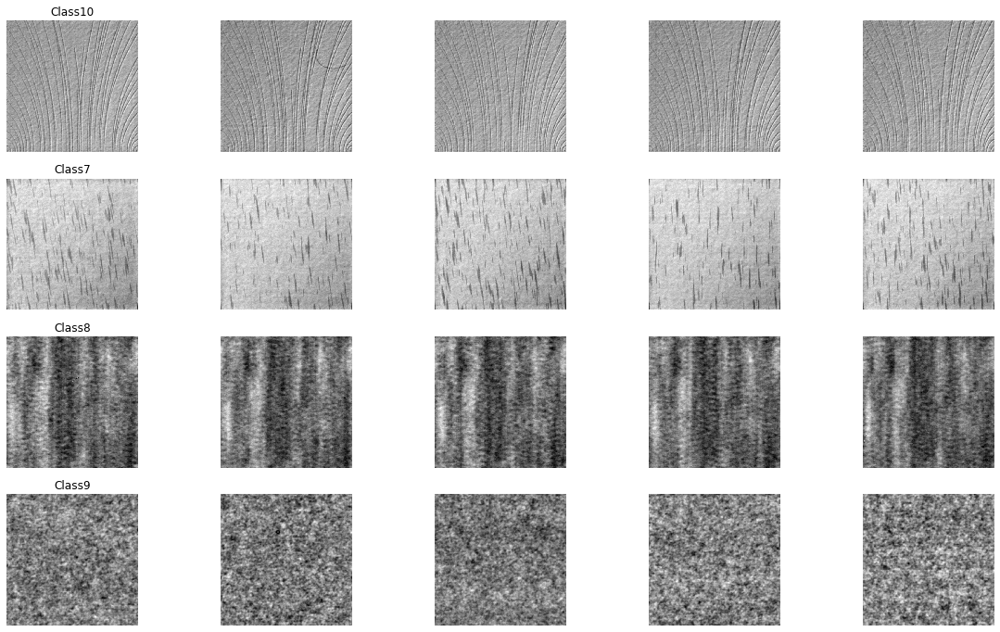

In [70]:
show_sample_images(dagm_competition_df, 'class', 4)

##### Split Dataframe into 2. One for defective samples and one for non-defective samples

In [71]:
#Non-Defective
dagm_competition_non_defective_df = dagm_competition_df.loc[(dagm_competition_df['defective_tag'] == 0)]
dagm_competition_non_defective_df

#Defective
dagm_competition_defective_df = dagm_competition_df.loc[(dagm_competition_df['defective_tag'] == 1)]
dagm_competition_defective_df

,path,class,class_code,defective_tag,image_file,defective_image_file,image
0,..\data\DAGM Competition\Class10\0001.PNG,Class10,0,0,0001.PNG,0,"[[16, 68, 73, 78, 66, 65, 69, 55, 73, 73, 84, ..."
1,..\data\DAGM Competition\Class10\0002.PNG,Class10,0,0,0002.PNG,0,"[[7, 54, 59, 70, 68, 64, 58, 60, 39, 37, 31, 2..."
2,..\data\DAGM Competition\Class10\0003.PNG,Class10,0,0,0003.PNG,0,"[[6, 48, 60, 72, 74, 69, 64, 69, 73, 58, 48, 3..."
3,..\data\DAGM Competition\Class10\0004.PNG,Class10,0,0,0004.PNG,0,"[[0, 69, 74, 70, 58, 52, 58, 68, 75, 75, 75, 6..."
4,..\data\DAGM Competition\Class10\0005.PNG,Class10,0,0,0005.PNG,0,"[[8, 62, 62, 69, 75, 64, 64, 66, 59, 53, 39, 5..."
...,...,...,...,...,...,...,...
9195,..\data\DAGM Competition\Class9\2296.PNG,Class9,3,0,2296.PNG,0,"[[129, 120, 135, 135, 128, 132, 137, 140, 120,..."
9196,..\data\DAGM Competition\Class9\2297.PNG,Class9,3,0,2297.PNG,0,"[[132, 154, 159, 145, 140, 140, 118, 125, 110,..."
9197,..\data\DAGM Competition\Class9\2298.PNG,Class9,3,0,2298.PNG,0,"[[144, 147, 146, 154, 141, 145, 131, 125, 126,..."
9198,..\data\DAGM Competition\Class9\2299.PNG,Class9,3,0,2299.PNG,0,"[[185, 179, 184, 184, 188, 194, 180, 183, 169,..."


,path,class,class_code,defective_tag,image_file,defective_image_file,image
12,..\data\DAGM Competition\Class10\0013.PNG,Class10,0,1,0013.PNG,0013_label.PNG,"[[5, 54, 58, 64, 69, 65, 68, 55, 49, 49, 56, 3..."
19,..\data\DAGM Competition\Class10\0020.PNG,Class10,0,1,0020.PNG,0020_label.PNG,"[[25, 89, 78, 79, 62, 66, 63, 63, 74, 60, 59, ..."
44,..\data\DAGM Competition\Class10\0045.PNG,Class10,0,1,0045.PNG,0045_label.PNG,"[[14, 49, 67, 65, 81, 81, 83, 74, 72, 67, 65, ..."
46,..\data\DAGM Competition\Class10\0047.PNG,Class10,0,1,0047.PNG,0047_label.PNG,"[[18, 70, 78, 70, 83, 84, 75, 79, 65, 75, 66, ..."
63,..\data\DAGM Competition\Class10\0064.PNG,Class10,0,1,0064.PNG,0064_label.PNG,"[[4, 50, 52, 74, 62, 68, 74, 66, 61, 60, 61, 6..."
...,...,...,...,...,...,...,...
9111,..\data\DAGM Competition\Class9\2212.PNG,Class9,3,1,2212.PNG,2212_label.PNG,"[[134, 136, 135, 142, 138, 137, 127, 119, 114,..."
9120,..\data\DAGM Competition\Class9\2221.PNG,Class9,3,1,2221.PNG,2221_label.PNG,"[[172, 179, 179, 170, 164, 171, 163, 163, 164,..."
9128,..\data\DAGM Competition\Class9\2229.PNG,Class9,3,1,2229.PNG,2229_label.PNG,"[[109, 103, 114, 127, 123, 131, 131, 128, 136,..."
9137,..\data\DAGM Competition\Class9\2238.PNG,Class9,3,1,2238.PNG,2238_label.PNG,"[[185, 168, 150, 158, 140, 121, 112, 117, 116,..."


##### Split each Dataframe into 4 further Dataframes, one for each class. This results in 8 Dataframes

In [72]:
#Non-Defective
dagm_competition_non_defective_seven_df = dagm_competition_non_defective_df.loc[(dagm_competition_non_defective_df['class_code'] == 1)]
dagm_competition_non_defective_eight_df = dagm_competition_non_defective_df.loc[(dagm_competition_non_defective_df['class_code'] == 2)]
dagm_competition_non_defective_nine_df = dagm_competition_non_defective_df.loc[(dagm_competition_non_defective_df['class_code'] == 3)]
dagm_competition_non_defective_ten_df = dagm_competition_non_defective_df.loc[(dagm_competition_non_defective_df['class_code'] == 0)]
#Defective
dagm_competition_defective_seven_df = dagm_competition_defective_df.loc[(dagm_competition_defective_df['class_code'] == 1)]
dagm_competition_defective_eight_df = dagm_competition_defective_df.loc[(dagm_competition_defective_df['class_code'] == 2)]
dagm_competition_defective_nine_df = dagm_competition_defective_df.loc[(dagm_competition_defective_df['class_code'] == 3)]
dagm_competition_defective_ten_df = dagm_competition_defective_df.loc[(dagm_competition_defective_df['class_code'] == 0)]

##### Split into Features. Target split not needed here as Features already split into required Targets

In [73]:
#Non-Defective
x_dagm_competition_non_defective_seven = dagm_competition_non_defective_seven_df['image']
x_dagm_competition_non_defective_eight = dagm_competition_non_defective_eight_df['image']
x_dagm_competition_non_defective_nine = dagm_competition_non_defective_nine_df['image']
x_dagm_competition_non_defective_ten = dagm_competition_non_defective_ten_df['image']
#Defective
x_dagm_competition_defective_seven = dagm_competition_defective_seven_df['image']
x_dagm_competition_defective_eight = dagm_competition_defective_eight_df['image']
x_dagm_competition_defective_nine = dagm_competition_defective_nine_df['image']
x_dagm_competition_defective_ten = dagm_competition_defective_ten_df['image']

##### Select 500 random samples from each class for the class prototype

In [74]:
prototype_dagm_comp_seven = np.random.choice(x_dagm_competition_non_defective_seven, 500, replace=False)
prototype_dagm_comp_eight = np.random.choice(x_dagm_competition_non_defective_eight, 500, replace=False)
prototype_dagm_comp_nine = np.random.choice(x_dagm_competition_non_defective_nine, 500, replace=False)
prototype_dagm_comp_ten = np.random.choice(x_dagm_competition_non_defective_ten, 500, replace=False)

##### Convert prototypes into numpy arrays

In [75]:
prototype_dagm_comp_seven = np.asarray(prototype_dagm_comp_seven.tolist())
print(prototype_dagm_comp_seven.shape)

prototype_dagm_comp_eight = np.asarray(prototype_dagm_comp_eight.tolist())
print(prototype_dagm_comp_seven.shape)

prototype_dagm_comp_nine = np.asarray(prototype_dagm_comp_nine.tolist())
print(prototype_dagm_comp_seven.shape)

prototype_dagm_comp_ten = np.asarray(prototype_dagm_comp_ten.tolist())
print(prototype_dagm_comp_seven.shape)

(500, 512, 512)
(500, 512, 512)
(500, 512, 512)
(500, 512, 512)


##### Reshape prototypes from 3D to 4D

In [76]:
prototype_dagm_comp_seven = np.expand_dims(prototype_dagm_comp_seven, 3)
prototype_dagm_comp_eight = np.expand_dims(prototype_dagm_comp_eight, 3)
prototype_dagm_comp_nine = np.expand_dims(prototype_dagm_comp_nine, 3)
prototype_dagm_comp_ten = np.expand_dims(prototype_dagm_comp_ten, 3)

##### Convert features into numpy arrays

In [77]:
#Non-Defective
x_dagm_competition_non_defective_seven = np.asarray(x_dagm_competition_non_defective_seven.tolist())
print(x_dagm_competition_non_defective_seven.shape)
x_dagm_competition_non_defective_eight = np.asarray(x_dagm_competition_non_defective_eight.tolist())
print(x_dagm_competition_non_defective_eight.shape)
x_dagm_competition_non_defective_nine = np.asarray(x_dagm_competition_non_defective_nine.tolist())
print(x_dagm_competition_non_defective_nine.shape)
x_dagm_competition_non_defective_ten = np.asarray(x_dagm_competition_non_defective_ten.tolist())
print(x_dagm_competition_non_defective_ten.shape)

#Defective
x_dagm_competition_defective_seven = np.asarray(x_dagm_competition_defective_seven.tolist())
print(x_dagm_competition_defective_seven.shape)
x_dagm_competition_defective_eight = np.asarray(x_dagm_competition_defective_eight.tolist())
print(x_dagm_competition_defective_eight.shape)
x_dagm_competition_defective_nine = np.asarray(x_dagm_competition_defective_nine.tolist())
print(x_dagm_competition_defective_nine.shape)
x_dagm_competition_defective_ten = np.asarray(x_dagm_competition_defective_ten.tolist())
print(x_dagm_competition_defective_ten.shape)

(2000, 512, 512)
(2000, 512, 512)
(2000, 512, 512)
(2000, 512, 512)
(300, 512, 512)
(300, 512, 512)
(300, 512, 512)
(300, 512, 512)


##### Reshape features from 3D to 4D

In [78]:
#Non-Defective
x_dagm_competition_non_defective_seven = np.expand_dims(x_dagm_competition_non_defective_seven, 3)
x_dagm_competition_non_defective_eight = np.expand_dims(x_dagm_competition_non_defective_eight, 3)
x_dagm_competition_non_defective_nine = np.expand_dims(x_dagm_competition_non_defective_nine, 3)
x_dagm_competition_non_defective_ten = np.expand_dims(x_dagm_competition_non_defective_ten, 3)

#Defective
x_dagm_competition_defective_seven = np.expand_dims(x_dagm_competition_defective_seven, 3)
x_dagm_competition_defective_eight = np.expand_dims(x_dagm_competition_defective_eight, 3)
x_dagm_competition_defective_nine = np.expand_dims(x_dagm_competition_defective_nine, 3)
x_dagm_competition_defective_ten = np.expand_dims(x_dagm_competition_defective_ten, 3)

##### Normalize prototypes

In [2]:
prototype_dagm_comp_seven_normalized = normalize_test_images(prototype_dagm_comp_seven)
prototype_dagm_comp_eight_normalized = normalize_test_images(prototype_dagm_comp_eight)
prototype_dagm_comp_nine_normalized = normalize_test_images(prototype_dagm_comp_nine)
prototype_dagm_comp_ten_normalized = normalize_test_images(prototype_dagm_comp_ten)
# prototype_dagm_comp_seven_normalized = normalize_test_images(prototype_dagm_comp_seven[0:300])
# prototype_dagm_comp_eight_normalized = normalize_test_images(prototype_dagm_comp_eight[0:300])
# prototype_dagm_comp_nine_normalized = normalize_test_images(prototype_dagm_comp_nine[0:300])
# prototype_dagm_comp_ten_normalized = normalize_test_images(prototype_dagm_comp_ten[0:300])

##### Deleting unneeded objects from memory

In [ ]:
del prototype_dagm_comp_seven, prototype_dagm_comp_eight, prototype_dagm_comp_nine, prototype_dagm_comp_ten, dagm_competition_non_defective_seven_df, dagm_competition_non_defective_eight_df, dagm_competition_non_defective_nine_df, dagm_competition_non_defective_ten_df, dagm_competition_defective_seven_df, dagm_competition_defective_eight_df, dagm_competition_defective_nine_df, dagm_competition_defective_ten_df, dagm_competition_non_defective_df, dagm_competition_defective_df, dagm_competition_df

##### Normalize non-defective features

In [ ]:
x_dagm_competition_non_defective_seven_normalized = normalize_test_images(x_dagm_competition_non_defective_seven)
x_dagm_competition_non_defective_eight_normalized = normalize_test_images(x_dagm_competition_non_defective_eight)
x_dagm_competition_non_defective_nine_normalized = normalize_test_images(x_dagm_competition_non_defective_nine)
x_dagm_competition_non_defective_ten_normalized = normalize_test_images(x_dagm_competition_non_defective_ten)
# x_dagm_competition_non_defective_seven_normalized = normalize_test_images(x_dagm_competition_non_defective_seven[0:300])
# x_dagm_competition_non_defective_eight_normalized = normalize_test_images(x_dagm_competition_non_defective_eight[0:300])
# x_dagm_competition_non_defective_nine_normalized = normalize_test_images(x_dagm_competition_non_defective_nine[0:300])
# x_dagm_competition_non_defective_ten_normalized = normalize_test_images(x_dagm_competition_non_defective_ten[0:300])

##### Deleting unneeded objects from memory

In [ ]:
del x_dagm_competition_non_defective_seven, x_dagm_competition_non_defective_eight, x_dagm_competition_non_defective_nine, x_dagm_competition_non_defective_ten

##### Normalize defective features

In [ ]:
x_dagm_competition_defective_seven_normalized = normalize_test_images(x_dagm_competition_defective_seven)
x_dagm_competition_defective_eight_normalized = normalize_test_images(x_dagm_competition_defective_eight)
x_dagm_competition_defective_nine_normalized = normalize_test_images(x_dagm_competition_defective_nine)
x_dagm_competition_defective_ten_normalized = normalize_test_images(x_dagm_competition_defective_ten)
# x_dagm_competition_defective_seven_normalized = normalize_test_images(x_dagm_competition_defective_seven[0:300])
# x_dagm_competition_defective_eight_normalized = normalize_test_images(x_dagm_competition_defective_eight[0:300])
# x_dagm_competition_defective_nine_normalized = normalize_test_images(x_dagm_competition_defective_nine[0:300])
# x_dagm_competition_defective_ten_normalized = normalize_test_images(x_dagm_competition_defective_ten[0:300])

In [ ]:
# import sys
# sys.getsizeof(x_dagm_competition_defective_seven_normalized)

##### Deleting unneeded objects from memory

In [ ]:
del x_dagm_competition_defective_seven, x_dagm_competition_defective_eight, x_dagm_competition_defective_nine, x_dagm_competition_defective_ten

#### <font color = 'green'>Our DAGM Competition data is now ready to be fed into our networks for our prototypes and testing.<br><br> Prototypes: <br><br> `prototype_dagm_comp_seven_normalized` <br><br> `prototype_dagm_comp_eight_normalized` <br><br> `prototype_dagm_comp_nine_normalized` <br><br> `prototype_dagm_comp_ten_normalized` <br><br> Features: <br><br> `x_dagm_competition_non_defective_seven_normalized` <br><br> `x_dagm_competition_non_defective_eight_normalized` <br><br> `x_dagm_competition_non_defective_nine_normalized` <br><br> `x_dagm_competition_non_defective_ten_normalized` <br><br> `x_dagm_competition_defective_seven_normalized` <br><br> `x_dagm_competition_defective_eight_normalized` <br><br> `x_dagm_competition_defective_nine_normalized` <br><br> `x_dagm_competition_defective_ten_normalized`
</font>



### 12. CIFAR100 Dataset: Reading and Processing Dataset

##### Importing Dataset from keras.datasets. Has to be loaded into Training and Testing sets.

In [71]:
(x_train_cifar, y_train_cifar), (x_test_cifar, y_test_cifar) = cifar100.load_data()

##### Find out Training and Testing Features Shape

In [72]:
print('Features Train Shape: %s' % str(x_train_cifar.shape))
print('Features Test Shape: %s' % str(x_test_cifar.shape))

Features Train Shape: (50000, 32, 32, 3)
Features Test Shape: (10000, 32, 32, 3)


##### Concatenate Training and Testing Features into just Training Features

In [73]:
x_cifar = np.concatenate((x_train_cifar, x_test_cifar), axis = 0)
print('Concatenated Features Shape: %s' % str(x_cifar.shape))

Concatenated Features Shape: (60000, 32, 32, 3)


In [3]:
# print(x_cifar)

##### Find out Training and Testing Targets Shape

In [75]:
print('Target Train Shape: %s' % str(y_train_cifar.shape))
print('Target Test Shape: %s' % str(y_test_cifar.shape))

Target Train Shape: (50000, 1)
Target Test Shape: (10000, 1)


##### Concatenate Training and Testing Targets into just Training Targets

In [76]:
y_cifar = np.concatenate((y_train_cifar, y_test_cifar), axis = 0)
print('Concatenated Target Shape: %s' % str(y_cifar.shape))

Concatenated Target Shape: (60000, 1)


In [77]:
print(y_cifar)

[[19]
 [29]
 [ 0]
 ...
 [51]
 [42]
 [70]]


### 13. CIFAR100 Dataset: Explatory Data Analysis

In [78]:
print('Total Number of Images: %s' % str(x_cifar.shape[0]))

Total Number of Images: 60000


In [79]:
print("Total Number of Classes: " + str(len(np.unique(y_cifar))))

Total Number of Classes: 100


In [80]:
print("The list of Classes: \n" + str(cifar_classes))

The list of Classes: 
['apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel', 'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock', 'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur', 'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 'house', 'kangaroo', 'computer_keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion', 'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse', 'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear', 'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine', 'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose', 'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake', 'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table', 'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout', 'tulip', 'turtle', 'war

In [81]:
print("Number of Images Per Class: \n" + str(np.unique(y_cifar, return_counts = True)))

Number of Images Per Class: 
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]), array([600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600, 600,
       600, 600, 600, 

There are 100 different classes with 600 images for each, totalling to 60,000 images in the whole dataset.

### 14. CIFAR100 Dataset: Further Data Pre-Processing

##### Visualize 30 Random Sample Images

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'house')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'shrew')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'aquarium_fish')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'bridge')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'forest')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'shrew')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'shrew')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'palm_tree')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'cloud')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'snail')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'streetcar')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'skunk')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'couch')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'squirrel')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'orange')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'lizard')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'willow_tree')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'bee')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'raccoon')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'snail')

C:\Users\tarek\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'chimpanzee')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'crocodile')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'camel')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'road')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'beaver')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'butterfly')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'beaver')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'castle')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'sunflower')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'rabbit')

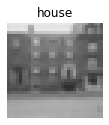

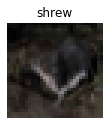

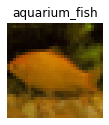

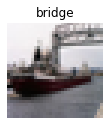

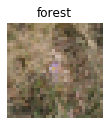

...

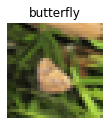

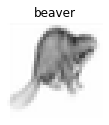

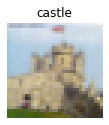

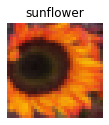

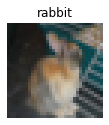

In [82]:
for i in np.random.randint(0, len(x_cifar)-1, 30):
    # Get data
    sample = x_cifar[i]
    target = y_cifar[i][0]
    # Set figure size and axis
    plt.figure(figsize=(1.75, 1.75))
    plt.axis('off')
    # Show data
    plt.imshow(sample)
    plt.title(f'{cifar_classes[target]}')
    #plt.savefig(f'./{i}.jpg')

##### Visualize Some Sample Images

In [83]:
# for i in range(9):
#     pyplot.subplot(330 + 1 + i)
#     pyplot.imshow(x_cifar[i])
# pyplot.show()

##### Converting all images to grayscale

In [84]:
x_cifar_gray = np.empty_like(x_cifar[...,0])
for i in range(x_cifar.shape[0]):
    x_cifar_gray[i] = cv2.cvtColor(x_cifar[i], cv2.COLOR_RGB2GRAY)
print(x_cifar_gray.shape)

(60000, 32, 32)


Shape changed from 4D to 3D eliminating (RGB) depth.

##### Visualize 30 Random Sample Images after Grayscaling

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'tiger')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'couch')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'pear')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'train')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'orange')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'bridge')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'pear')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'rose')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'camel')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'bowl')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'girl')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'willow_tree')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'orange')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'chimpanzee')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'mouse')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'leopard')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'ray')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'crab')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'clock')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'crab')

C:\Users\tarek\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'sunflower')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'can')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'leopard')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'lizard')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'sweet_pepper')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'squirrel')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'apple')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'bicycle')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'maple_tree')

<Figure size 126x126 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

Text(0.5, 1.0, 'turtle')

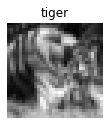

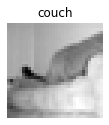

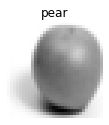

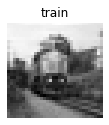

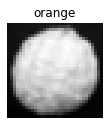

...

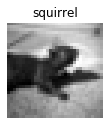

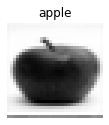

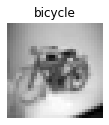

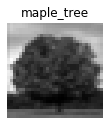

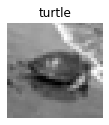

In [85]:
for i in np.random.randint(0, len(x_cifar_gray)-1, 30):
    # Get data
    sample = x_cifar_gray[i]
    target = y_cifar[i][0]
    # Set figure size and axis
    plt.figure(figsize=(1.75, 1.75))
    plt.axis('off')
    # Show data
    plt.imshow(sample, cmap="gray")
    plt.title(f'{cifar_classes[target]}')
    #plt.savefig(f'./{i}.jpg')

##### Visualize Some Sample Images after Grayscaling

In [86]:
# for i in range(9):
#     pyplot.subplot(330 + 1 + i)
#     pyplot.imshow(x_cifar_gray[i], cmap="gray")
# pyplot.show()

##### Normalizing all features to values between -1 and 1

In [87]:
x_cifar_gray_normalized = normalize_train_images(x_cifar_gray)

##### Find the width and height of the images

In [88]:
cifar_size = lambda img: tuple(img.shape[1::-1])
print("Width: ", cifar_size(x_cifar_gray_normalized[i])[0])
print("Height:", cifar_size(x_cifar_gray_normalized[i])[1])

Width:  32
Height: 32


##### Deleting unneeded objects to free up memory

In [89]:
del x_cifar_gray, x_cifar, x_train_cifar, y_train_cifar, x_test_cifar, y_test_cifar

#### <font color = 'green'>Our CIFAR100 data is now ready to be fed into our networks for testing.<br><br> Features: `x_cifar_gray_normalized`. Target: `y_cifar`</font>

### 15. Randomly Resizing Input Images

Textural regularities are expressed on different spatial scales, i.e. some patterns are easily recognizable when looking at patches of 32×32 pixels while others can only be identified when looking at larger image areas. Randomly resized the input images to either 512×512, 256×256, 128×128 or 64×64 pixels, while keeping the patch size fixed at 32×32.

<font color="red">Assumption: Equal split to each image resize pixel resolutions</font>

Kyleberg & DAGM Public training dataset:<br>
- Keep a quarter 512x512
- Resize a quarter to 256x256
- Resize a quarter to 128x128
- Resize a quarter to 64x64

##### Kyleberg: Display feature shape

In [90]:
print(x_kyleberg_normalized.shape)

(4480, 512, 512)


##### Kyleberg: Shuffle features deterministically

In [91]:
x_kyleberg_normalized_shuffled = shuffle_det(x_kyleberg_normalized)

##### Kyleberg: Shuffle targets deterministically

In [92]:
y_kyleberg_shuffled = shuffle_det(y_kyleberg_decoded)

##### Kyleberg: Split features and target array into four different ones [0.25, 0.25, 0.25, 0.25]

In [93]:
x_kyleberg_normalized_one, x_kyleberg_normalized_two, x_kyleberg_normalized_three, x_kyleberg_normalized_four = np.split(x_kyleberg_normalized_shuffled, 4)
y_kyleberg_one, y_kyleberg_two, y_kyleberg_three, y_kyleberg_four = np.split(y_kyleberg_shuffled, 4)

##### Kyleberg: Display each array shape

In [94]:
print(x_kyleberg_normalized_one.shape)
print(x_kyleberg_normalized_two.shape)
print(x_kyleberg_normalized_three.shape)
print(x_kyleberg_normalized_four.shape)

(1120, 512, 512)
(1120, 512, 512)
(1120, 512, 512)
(1120, 512, 512)


##### Kyleberg: Resize array two -> 256x256, Resize array three -> 128x128, Resize array four -> 64x64

In [95]:
x_kyleberg_normalized_two = resize_images(x_kyleberg_normalized_two, (256,256))
x_kyleberg_normalized_three = resize_images(x_kyleberg_normalized_three, (128,128))
x_kyleberg_normalized_four = resize_images(x_kyleberg_normalized_four, (64,64))

##### Kyleberg: Display each array shape after resizing

In [96]:
print(x_kyleberg_normalized_one.shape)
print(x_kyleberg_normalized_two.shape)
print(x_kyleberg_normalized_three.shape)
print(x_kyleberg_normalized_four.shape)

(1120, 512, 512)
(1120, 256, 256)
(1120, 128, 128)
(1120, 64, 64)


##### Deleting unneeded objects to free up memory

In [97]:
del x_kyleberg_normalized_shuffled, y_kyleberg_shuffled, y_kyleberg_decoded

#### <font color = 'green'>Our Kyleberg data has been resized and is now ready to be fed into our networks for training.<br><br> Features: 
- `x_kyleberg_normalized_one` 512x512 images
- `x_kyleberg_normalized_two` 256x256 images
- `x_kyleberg_normalized_three` 128x128 images
- `x_kyleberg_normalized_four` 64x64 images</font>

#### <font color = 'green'>Target:
- `y_kyleberg_one` 512x512 images
- `y_kyleberg_two` 256x256 images
- `y_kyleberg_three` 128x128 images
- `y_kyleberg_four` 64x64 images

##### DAGM Public: Display feature shape

In [98]:
print(x_dagm_public_non_defective_train_normalized.shape)

(3000, 512, 512)


##### DAGM Public: Shuffle features deterministically

In [99]:
x_dagm_public_non_defective_train_normalized_shuffled = shuffle_det(x_dagm_public_non_defective_train_normalized)

##### DAGM Public: Shuffle targets deterministically

In [100]:
y_dagm_public_non_defective_train_shuffled = shuffle_det(y_dagm_public_non_defective_train)

##### DAGM Public: Split features and target array into four different ones [0.25, 0.25, 0.25, 0.25]

In [101]:
x_dagm_public_non_defective_train_normalized_one, x_dagm_public_non_defective_train_normalized_two, x_dagm_public_non_defective_train_normalized_three, x_dagm_public_non_defective_train_normalized_four = np.split(x_dagm_public_non_defective_train_normalized_shuffled, 4)
y_dagm_public_non_defective_train_one, y_dagm_public_non_defective_train_two, y_dagm_public_non_defective_train_three, y_dagm_public_non_defective_train_four = np.split(y_dagm_public_non_defective_train_shuffled, 4)

##### DAGM Public: Display each array shape

In [102]:
print(x_dagm_public_non_defective_train_normalized_one.shape)
print(x_dagm_public_non_defective_train_normalized_two.shape)
print(x_dagm_public_non_defective_train_normalized_three.shape)
print(x_dagm_public_non_defective_train_normalized_four.shape)

(750, 512, 512)
(750, 512, 512)
(750, 512, 512)
(750, 512, 512)


##### DAGM Public: Resize array two -> 256x256, Resize array three -> 128x128, Resize array four -> 64x64

In [103]:
x_dagm_public_non_defective_train_normalized_two = resize_images(x_dagm_public_non_defective_train_normalized_two, (256,256))
x_dagm_public_non_defective_train_normalized_three = resize_images(x_dagm_public_non_defective_train_normalized_three, (128,128))
x_dagm_public_non_defective_train_normalized_four = resize_images(x_dagm_public_non_defective_train_normalized_four, (64,64))

##### DAGM Public:  Display each array shape after resizing

In [104]:
print(x_dagm_public_non_defective_train_normalized_one.shape)
print(x_dagm_public_non_defective_train_normalized_two.shape)
print(x_dagm_public_non_defective_train_normalized_three.shape)
print(x_dagm_public_non_defective_train_normalized_four.shape)

(750, 512, 512)
(750, 256, 256)
(750, 128, 128)
(750, 64, 64)


##### Deleting unneeded objects to free up memory

In [105]:
del x_dagm_public_non_defective_train_normalized_shuffled, y_dagm_public_non_defective_train_shuffled, y_dagm_public_non_defective_train

#### <font color = 'green'>Our DAGM Public data has been resized and is now ready to be fed into our networks for training.<br><br> Features: 
- `x_dagm_public_non_defective_train_normalized_one` 512x512 images
- `x_dagm_public_non_defective_train_normalized_two` 256x256 images
- `x_dagm_public_non_defective_train_normalized_three` 128x128 images
- `x_dagm_public_non_defective_train_normalized_four` 64x64 images</font>

#### <font color = 'green'>Target:
- `y_dagm_public_non_defective_train_one` 512x512 images
- `y_dagm_public_non_defective_train_two` 256x256 images
- `y_dagm_public_non_defective_train_three` 128x128 images
- `y_dagm_public_non_defective_train_four` 64x64 images

### 16. 32x32 Patches Pixel Sampling

From the resulting images, patches of 32x32 pixels were sampled at random positions. As some surface classes exhibit a global pattern the same-class images were sampled at the same positions as the input image, ensuring that patches are compared at the same position. These patches can be used as additional classes. The 32x32 patch sampling was done to the training data which include:
- Kyleberg Dataset
- DAGM Public Dataset (500 non-defect)
- (CIFAR100 already 32x32 so nothing to be done for it. Whole image will be passed into network for training)<br>

This will be done to both the original image and the image with guassian noise, and to all the different pic size resolutions.

##### Kyleberg: Print Normal Images Shape

In [106]:
print(x_kyleberg_normalized_one.shape)
print(x_kyleberg_normalized_two.shape)
print(x_kyleberg_normalized_three.shape)
print(x_kyleberg_normalized_four.shape)

(1120, 512, 512)
(1120, 256, 256)
(1120, 128, 128)
(1120, 64, 64)


##### Kyleberg: Print Images with Gaussian Noise Shape

In [107]:
# print(x_kyleberg_normalized_one_gaussian_noise.shape)
# print(x_kyleberg_normalized_two_gaussian_noise.shape)
# print(x_kyleberg_normalized_three_gaussian_noise.shape)
# print(x_kyleberg_normalized_four_gaussian_noise.shape)

#### Kyleberg: Print Target/Class Shape

In [108]:
print(y_kyleberg_one.shape)
print(y_kyleberg_two.shape)
print(y_kyleberg_three.shape)
print(y_kyleberg_four.shape)

(1120,)
(1120,)
(1120,)
(1120,)


##### Kyleberg: Extracting patches from each different pixel resolution images
<font color="red">Assumption: Number of patches to be extracted from different pixel resolution images</font><br><br>
16 patches from 512x512 -> 448 new classes<br>
8 patches from 256x256 -> 224 new classes<br>
4 patches from 128x128 -> 112 new classes<br>
2 patches from 64x64 -> 56 new classes

In [109]:
x_kyleberg_normalized_one_patches, y_kyleberg_one_patches = extract_patches(x_kyleberg_normalized_one, y_kyleberg_one, 16)
x_kyleberg_normalized_two_patches, y_kyleberg_two_patches = extract_patches(x_kyleberg_normalized_two, y_kyleberg_two, 8)
x_kyleberg_normalized_three_patches, y_kyleberg_three_patches = extract_patches(x_kyleberg_normalized_three, y_kyleberg_three, 4)
x_kyleberg_normalized_four_patches, y_kyleberg_four_patches = extract_patches(x_kyleberg_normalized_four, y_kyleberg_four, 2)
# x_kyleberg_normalized_one_patches, x_kyleberg_normalized_one_gaussian_noise_patches, y_kyleberg_one_patches = extract_patches(x_kyleberg_normalized_one, x_kyleberg_normalized_one_gaussian_noise, y_kyleberg_one, 5)
# x_kyleberg_normalized_two_patches, x_kyleberg_normalized_two_gaussian_noise_patches, y_kyleberg_two_patches = extract_patches(x_kyleberg_normalized_two, x_kyleberg_normalized_two_gaussian_noise, y_kyleberg_two, 3)
# x_kyleberg_normalized_three_patches, x_kyleberg_normalized_three_gaussian_noise_patches, y_kyleberg_three_patches = extract_patches(x_kyleberg_normalized_three, x_kyleberg_normalized_three_gaussian_noise, y_kyleberg_three, 2)
# x_kyleberg_normalized_four_patches, x_kyleberg_normalized_four_gaussian_noise_patches, y_kyleberg_four_patches = extract_patches(x_kyleberg_normalized_four, x_kyleberg_normalized_four_gaussian_noise, y_kyleberg_four, 1)


Image Resolutions Shape: (1120, 512, 512)
Number of Patches to be extracted: 16
Normal Images Patches Shape: (17920, 32, 32)
New Patch Classes Shape: (17920,)
Number of New Unique Patch Classes Created: 448

Image Resolutions Shape: (1120, 256, 256)
Number of Patches to be extracted: 8
Normal Images Patches Shape: (8960, 32, 32)
New Patch Classes Shape: (8960,)
Number of New Unique Patch Classes Created: 224

Image Resolutions Shape: (1120, 128, 128)
Number of Patches to be extracted: 4
Normal Images Patches Shape: (4480, 32, 32)
New Patch Classes Shape: (4480,)
Number of New Unique Patch Classes Created: 112

Image Resolutions Shape: (1120, 64, 64)
Number of Patches to be extracted: 2
Normal Images Patches Shape: (2240, 32, 32)
New Patch Classes Shape: (2240,)
Number of New Unique Patch Classes Created: 56


##### Kyleberg: View Sample Image

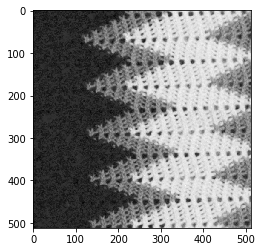

In [110]:
plt.imshow(x_kyleberg_normalized_one[0], cmap="gray")

##### Kyleberg: View Extracted Patches from Sample Image

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

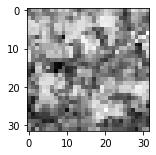

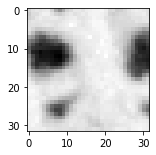

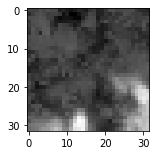

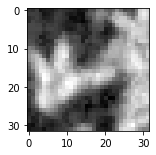

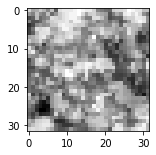

...

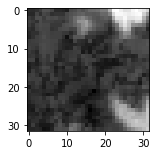

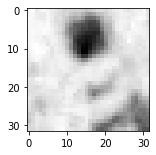

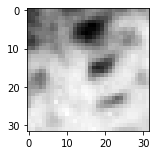

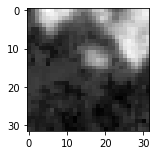

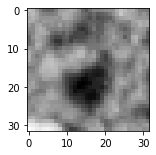

In [111]:
for i in range(16):
    plt.figure(figsize=(2.25, 2.25))
    plt.imshow(x_kyleberg_normalized_one_patches[i], cmap = "gray")

##### Kyleberg: Ensure New Patch Classes got Created Correctly

In [112]:
print(y_kyleberg_one)
print(y_kyleberg_one_patches)

[ 1 25 15 ... 26 21 20]
[ 16  17  18 ... 333 334 335]


##### Kyleberg: View Sample Image (2)

<Figure size 126x126 with 0 Axes>

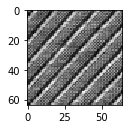

In [113]:
plt.figure(figsize=(1.75, 1.75))
plt.imshow(x_kyleberg_normalized_four[200], cmap="gray")

##### Kyleberg: View Extracted Patch from Sample Image (2)

<Figure size 90x90 with 0 Axes>

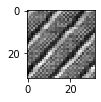

In [114]:
plt.figure(figsize=(1.25, 1.25))
plt.imshow(x_kyleberg_normalized_four_patches[400], cmap="gray")

<Figure size 90x90 with 0 Axes>

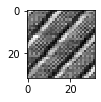

In [115]:
plt.figure(figsize=(1.25, 1.25))
plt.imshow(x_kyleberg_normalized_four_patches[401], cmap="gray")

#### <font color = 'green'>Our Kyleberg data is now fully ready to be fed into our networks for training.<br><br> Features: 
- `x_kyleberg_normalized_one_patches` 512x512 images (17920, 32, 32)
- `x_kyleberg_normalized_two_patches` 256x256 images (8960, 32, 32)
- `x_kyleberg_normalized_three_patches` 128x128 images (4480, 32, 32)
- `x_kyleberg_normalized_four_patches` 64x64 images (2240, 32, 32)</font>

#### <font color = 'green'>Target:
- `y_kyleberg_one_patches` 512x512 images (17920,)
- `y_kyleberg_two_patches` 256x256 images (8960,)
- `y_kyleberg_three_patches` 128x128 images (4480,)
- `y_kyleberg_four_patches` 64x64 images (2240,)

##### DAGM Public: Print Normal Images Shape

In [116]:
print(x_dagm_public_non_defective_train_normalized_one.shape)
print(x_dagm_public_non_defective_train_normalized_two.shape)
print(x_dagm_public_non_defective_train_normalized_three.shape)
print(x_dagm_public_non_defective_train_normalized_four.shape)

(750, 512, 512)
(750, 256, 256)
(750, 128, 128)
(750, 64, 64)


##### DAGM Public: Print Images with Gaussian Noise Shape

In [117]:
# print(x_dagm_public_non_defective_train_normalized_one_gaussian_noise.shape)
# print(x_dagm_public_non_defective_train_normalized_two_gaussian_noise.shape)
# print(x_dagm_public_non_defective_train_normalized_three_gaussian_noise.shape)
# print(x_dagm_public_non_defective_train_normalized_four_gaussian_noise.shape)

#### DAGM Public: Print Target/Class Shape

In [118]:
print(y_dagm_public_non_defective_train_one.shape)
print(y_dagm_public_non_defective_train_two.shape)
print(y_dagm_public_non_defective_train_three.shape)
print(y_dagm_public_non_defective_train_four.shape)

(750,)
(750,)
(750,)
(750,)


We need to decode the target back to a single number for extraction and training to work.

#### DAGM Public: Decoding Target/Class Shape¶

In [119]:
# y_dagm_public_non_defective_decoded_train_one = one_hot_decoding(y_dagm_public_non_defective_encoded_train_one)
# y_dagm_public_non_defective_decoded_train_two = one_hot_decoding(y_dagm_public_non_defective_encoded_train_two)
# y_dagm_public_non_defective_decoded_train_three = one_hot_decoding(y_dagm_public_non_defective_encoded_train_three)
# y_dagm_public_non_defective_decoded_train_four = one_hot_decoding(y_dagm_public_non_defective_encoded_train_four)

##### DAGM Public: Extracting patches from each different pixel resolution images
<font color="red">Assumption: Number of patches to be extracted from different pixel resolution images</font><br><br>
16 patches from 512x512 -> 96 new classes<br>
8 patches from 256x256 -> 48 new classes<br>
4 patches from 128x128 -> 24 new classes<br>
2 patches from 64x64 -> 12 classes

In [120]:
x_dagm_public_one_patches, y_dagm_public_one_patches = extract_patches(x_dagm_public_non_defective_train_normalized_one, y_dagm_public_non_defective_train_one, 16)
x_dagm_public_two_patches, y_dagm_public_two_patches = extract_patches(x_dagm_public_non_defective_train_normalized_two, y_dagm_public_non_defective_train_two, 8)
x_dagm_public_three_patches, y_dagm_public_three_patches = extract_patches(x_dagm_public_non_defective_train_normalized_three, y_dagm_public_non_defective_train_three, 4)
x_dagm_public_four_patches, y_dagm_public_four_patches = extract_patches(x_dagm_public_non_defective_train_normalized_four, y_dagm_public_non_defective_train_four, 2)
# x_dagm_public_one_patches, x_dagm_public_one_gaussian_noise_patches, y_dagm_public_one_patches = extract_patches(x_dagm_public_non_defective_train_normalized_one, x_dagm_public_non_defective_train_normalized_one_gaussian_noise, y_dagm_public_non_defective_train_one, 5)
# x_dagm_public_two_patches, x_dagm_public_two_gaussian_noise_patches, y_dagm_public_two_patches = extract_patches(x_dagm_public_non_defective_train_normalized_two, x_dagm_public_non_defective_train_normalized_two_gaussian_noise, y_dagm_public_non_defective_train_two, 3)
# x_dagm_public_three_patches, x_dagm_public_three_gaussian_noise_patches, y_dagm_public_three_patches = extract_patches(x_dagm_public_non_defective_train_normalized_three, x_dagm_public_non_defective_train_normalized_three_gaussian_noise, y_dagm_public_non_defective_train_three, 2)
# x_dagm_public_four_patches, x_dagm_public_four_gaussian_noise_patches, y_dagm_public_four_patches = extract_patches(x_dagm_public_non_defective_train_normalized_four, x_dagm_public_non_defective_train_normalized_four_gaussian_noise, y_dagm_public_non_defective_train_four, 1)


Image Resolutions Shape: (750, 512, 512)
Number of Patches to be extracted: 16
Normal Images Patches Shape: (12000, 32, 32)
New Patch Classes Shape: (12000,)
Number of New Unique Patch Classes Created: 96

Image Resolutions Shape: (750, 256, 256)
Number of Patches to be extracted: 8
Normal Images Patches Shape: (6000, 32, 32)
New Patch Classes Shape: (6000,)
Number of New Unique Patch Classes Created: 48

Image Resolutions Shape: (750, 128, 128)
Number of Patches to be extracted: 4
Normal Images Patches Shape: (3000, 32, 32)
New Patch Classes Shape: (3000,)
Number of New Unique Patch Classes Created: 24

Image Resolutions Shape: (750, 64, 64)
Number of Patches to be extracted: 2
Normal Images Patches Shape: (1500, 32, 32)
New Patch Classes Shape: (1500,)
Number of New Unique Patch Classes Created: 12


##### DAGM Public: View Sample Image

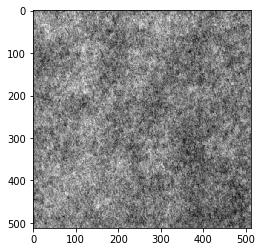

In [121]:
plt.imshow(x_dagm_public_non_defective_train_normalized_one[0], cmap="gray")

##### DAGM Public: View Extracted Patches from Sample Image

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

<Figure size 162x162 with 0 Axes>

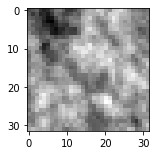

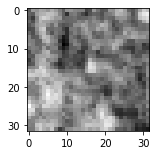

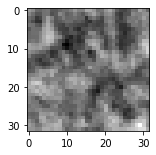

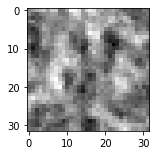

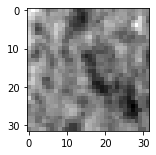

...

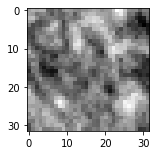

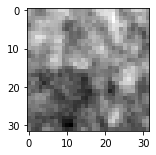

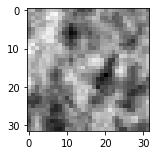

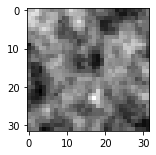

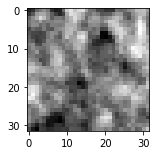

In [122]:
for i in range(16):
    plt.figure(figsize=(2.25, 2.25))
    plt.imshow(x_dagm_public_one_patches[i], cmap = "gray")

##### DAGM Public: Ensure New Patch Classes got Created Correctly

In [123]:
print(y_dagm_public_non_defective_train_one)
print(y_dagm_public_one_patches)

[4 2 2 1 0 2 2 1 5 3 2 5 3 1 2 1 2 4 5 0 2 3 5 1 2 2 1 4 3 0 0 2 0 1 4 1 1
 5 2 1 4 5 1 5 0 3 3 2 4 5 5 1 2 1 2 2 5 0 4 0 0 2 1 0 4 5 3 2 2 5 2 2 1 3
 1 2 4 5 4 5 0 5 3 5 5 2 0 2 0 0 4 1 4 0 3 0 4 2 3 3 0 3 0 2 0 2 4 2 4 2 5
 5 0 2 0 1 2 3 4 0 4 3 1 5 5 2 5 3 5 3 4 1 5 5 3 4 1 4 0 4 1 3 4 3 5 5 4 5
 5 4 0 3 2 5 1 4 3 3 4 1 4 4 1 5 0 3 3 2 1 0 1 4 4 2 1 2 3 2 1 4 3 3 0 3 5
 1 5 3 1 3 5 5 0 3 4 5 1 4 4 3 0 5 3 3 4 2 2 0 1 5 1 0 5 3 2 4 0 2 1 1 5 3
 5 2 2 3 1 4 0 1 5 2 3 4 3 5 4 0 5 4 0 3 0 2 1 2 5 3 0 3 0 3 0 5 1 1 0 1 5
 2 3 2 1 4 2 1 4 5 3 2 1 2 0 1 3 2 3 3 1 3 3 0 1 5 5 0 0 1 3 4 4 2 0 5 4 4
 0 5 5 2 4 0 2 3 1 0 5 1 3 4 3 3 0 0 0 2 4 3 4 2 3 4 4 1 2 3 5 2 5 5 0 2 5
 4 1 4 5 2 1 4 4 3 4 3 3 1 4 0 4 2 4 0 0 4 1 0 4 5 2 5 2 3 2 3 0 1 2 4 5 3
 5 5 4 3 4 4 0 5 0 2 1 5 0 1 1 0 4 5 4 3 5 0 0 0 1 0 5 1 5 2 2 1 2 5 4 4 4
 3 3 5 5 2 1 4 5 5 1 1 5 1 3 2 1 1 2 4 5 2 4 2 2 4 2 2 0 1 0 4 3 4 5 3 5 2
 0 0 4 3 1 4 1 5 1 2 0 3 5 0 4 5 4 3 4 1 5 4 1 3 0 1 3 0 2 3 2 1 0 2 4 5 3
 4 3 1 2 3 4 5 5 4 0 1 4 

#### <font color = 'green'>Our DAGM Public data is now fully ready to be fed into our networks for training.<br><br> Features: 
- `x_dagm_public_one_patches` 512x512 images (12000, 32, 32)
- `x_dagm_public_two_patches` 256x256 images (6000, 32, 32)
- `x_dagm_public_three_patches` 128x128 images (3000, 32, 32)
- `x_dagm_public_four_patches` 64x64 images (1500, 32, 32)</font>

#### <font color = 'green'>Target:
- `y_dagm_public_one_patches` 512x512 images (12000,)
- `y_dagm_public_two_patches` 256x256 images (6000,)
- `y_dagm_public_three_patches` 128x128 images (3000,)
- `y_dagm_public_four_patches` 64x64 images (1500,)

##### Deleting unneeded objects from memory

In [124]:
#del x_kyleberg_normalized_one, x_kyleberg_normalized_two, x_kyleberg_normalized_three, x_kyleberg_normalized_four, x_kyleberg_normalized_one_gaussian_noise, x_kyleberg_normalized_two_gaussian_noise, x_kyleberg_normalized_three_gaussian_noise, x_kyleberg_normalized_four_gaussian_noise, y_kyleberg_one, y_kyleberg_two, y_kyleberg_three, y_kyleberg_four 

In [125]:
#del x_dagm_public_non_defective_train_normalized_one, x_dagm_public_non_defective_train_normalized_two, x_dagm_public_non_defective_train_normalized_three, x_dagm_public_non_defective_train_normalized_four, x_dagm_public_non_defective_train_normalized_one_gaussian_noise, x_dagm_public_non_defective_train_normalized_two_gaussian_noise, x_dagm_public_non_defective_train_normalized_three_gaussian_noise, x_dagm_public_non_defective_train_normalized_four_gaussian_noise, y_dagm_public_non_defective_train_one, y_dagm_public_non_defective_train_two, y_dagm_public_non_defective_train_three, y_dagm_public_non_defective_train_four

### 17. Artificially Corrupt Images with Gaussian Noise

Artificially corrupted same-class samples with patches of Gaussian noise and labelled the results as out-of-class samples. Aim is to increase sensibility to local deviations. These are going to be fed as 'c' into our networks.

##### Kyleberg: Viewing a sample image with different Gaussian Noises applied to the whole image

<Figure size 1296x1728 with 0 Axes>

Text(0.5, 1.0, 'Original')

Text(0.5, 1.0, 'Default Gaussian Noise Added')

Text(0.5, 1.0, 'Controlled Gaussian Noise Added')

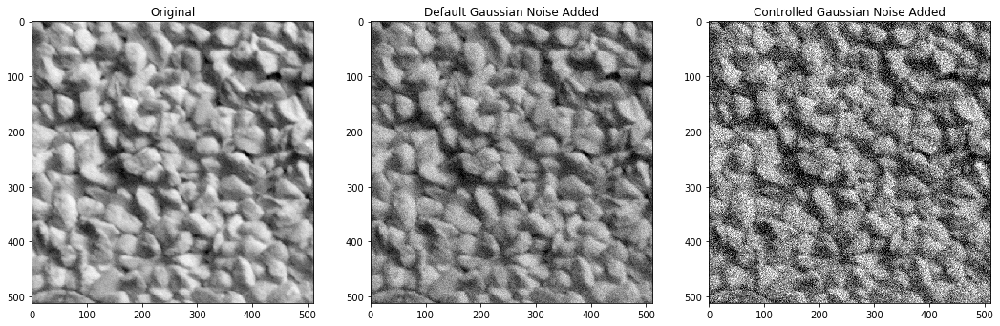

In [126]:
plt.figure(figsize=(18,24))

plt.subplot(1,3,1)
plt.title("Original")
plt.imshow(x_kyleberg_normalized[2000], cmap="gray")

plt.subplot(1,3,2)
plt.title("Default Gaussian Noise Added")
gimg = skimage.util.random_noise(x_kyleberg_normalized[2000], mode="gaussian") #Default mean 0 and var 0.01
plt.imshow(gimg, cmap="gray")

plt.subplot(1,3,3)
plt.title("Controlled Gaussian Noise Added")
gimg = skimage.util.random_noise(x_kyleberg_normalized[2000], mode="gaussian", mean = 0, var=(x_kyleberg_normalized[2000].std() ** 2))
plt.imshow(gimg, cmap="gray")

##### Kyleberg: Viewing a sample image with Gaussian noise applied to only part of the image

<Figure size 1296x1728 with 0 Axes>

Text(0.5, 1.0, 'Original')

Text(0.5, 1.0, 'Default Gaussian Noise Added')

Text(0.5, 1.0, 'Controlled Gaussian Noise Added')

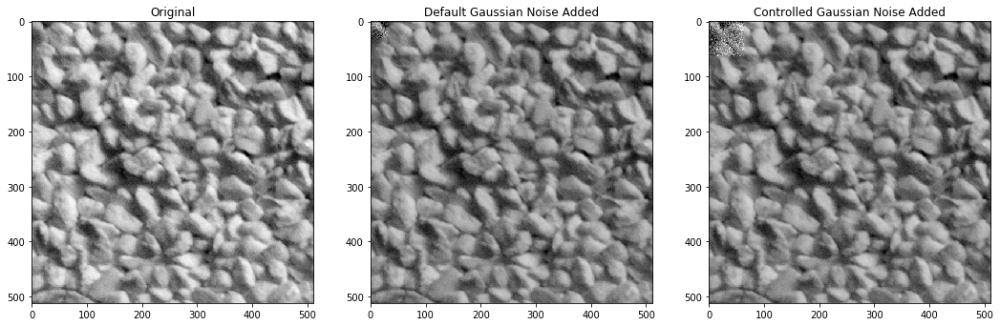

In [127]:
plt.figure(figsize=(18,24))

plt.subplot(1,3,1)
plt.title("Original")
plt.imshow(x_kyleberg_normalized[2000], cmap="gray")

plt.subplot(1,3,2)
plt.title("Default Gaussian Noise Added")
plt.imshow(add_gaussian_noise(x_kyleberg_normalized[2000], 0, 32, 0 , 32), cmap="gray")

plt.subplot(1,3,3)
plt.title("Controlled Gaussian Noise Added")
plt.imshow(add_gaussian_noise(x_kyleberg_normalized[2000], 0, 64, 0 , 64), cmap="gray")

##### Kyleberg: Adding Gaussian Noise of Zero Mean and Unit Standard Deviation to the images

In [128]:
x_kyleberg_normalized_one_patches_gaussian_noise = add_gaussian_noise_loop(x_kyleberg_normalized_one_patches)
x_kyleberg_normalized_two_patches_gaussian_noise = add_gaussian_noise_loop(x_kyleberg_normalized_two_patches)
x_kyleberg_normalized_three_patches_gaussian_noise = add_gaussian_noise_loop(x_kyleberg_normalized_three_patches)
x_kyleberg_normalized_four_patches_gaussian_noise = add_gaussian_noise_loop(x_kyleberg_normalized_four_patches)

##### Kyleberg: View sample original image vs added Gaussian Noise for each differently sized arrays

In [129]:
# plt.figure(figsize=(8,10))

# plt.subplot(1,2,1)
# plt.title("Original 512x512")
# plt.imshow(x_kyleberg_normalized_one_patches[1000], cmap="gray")

# plt.subplot(1,2,2)
# plt.title("Gaussian Noise Added")
# plt.imshow(x_kyleberg_normalized_one_patches_gaussian_noise[1000], cmap="gray")

<Figure size 576x720 with 0 Axes>

Text(0.5, 1.0, 'Original 512x512')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 256x256')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 128x128')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 64x64')

Text(0.5, 1.0, 'Gaussian Noise Added')

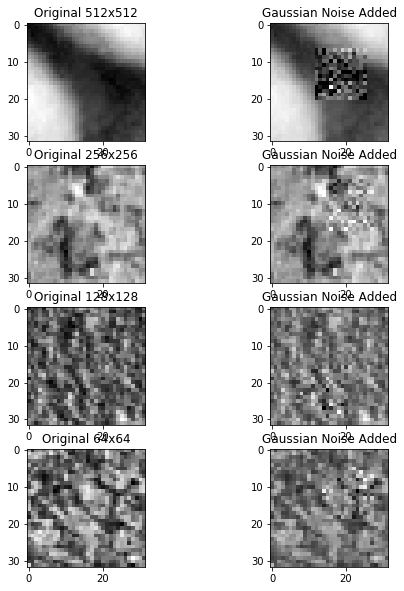

In [130]:
plt.figure(figsize=(8,10))

plt.subplot(4,2,1)
plt.title("Original 512x512")
plt.imshow(x_kyleberg_normalized_one_patches[1000], cmap="gray")

plt.subplot(4,2,2)
plt.title("Gaussian Noise Added")
plt.imshow(x_kyleberg_normalized_one_patches_gaussian_noise[1000], cmap="gray")

plt.subplot(4,2,3)
plt.title("Original 256x256")
plt.imshow(x_kyleberg_normalized_two_patches[1000], cmap="gray")

plt.subplot(4,2,4)
plt.title("Gaussian Noise Added")
plt.imshow(x_kyleberg_normalized_two_patches_gaussian_noise[1000], cmap="gray")

plt.subplot(4,2,5)
plt.title("Original 128x128")
plt.imshow(x_kyleberg_normalized_three_patches[1000], cmap="gray")

plt.subplot(4,2,6)
plt.title("Gaussian Noise Added")
plt.imshow(x_kyleberg_normalized_three_patches_gaussian_noise[1000], cmap="gray")

plt.subplot(4,2,7)
plt.title("Original 64x64")
plt.imshow(x_kyleberg_normalized_four_patches[1000], cmap="gray")

plt.subplot(4,2,8)
plt.title("Gaussian Noise Added")
plt.imshow(x_kyleberg_normalized_four_patches_gaussian_noise[1000], cmap="gray")

#### <font color = 'green'>Our Kyleberg data has been artifically corrupted and is now ready to be fed into our networks for training as out-of-class samples.<br><br> Features: 
- `x_kyleberg_normalized_one_patches_gaussian_noise` 512x512 images (17920, 32, 32)
- `x_kyleberg_normalized_two_patches_gaussian_noise` 256x256 images (8960, 32, 32)
- `x_kyleberg_normalized_three_patches_gaussian_noise` 128x128 images (4480, 32, 32)
- `x_kyleberg_normalized_four_patches_gaussian_noise` 64x64 images (2240, 32, 32) </font>

##### DAGM Public: Adding Gaussian Noise of Zero Mean and Unit Standard Deviation to the images

In [131]:
x_dagm_public_one_patches_gaussian_noise = add_gaussian_noise_loop(x_dagm_public_one_patches)
x_dagm_public_two_patches_gaussian_noise = add_gaussian_noise_loop(x_dagm_public_two_patches)
x_dagm_public_three_patches_gaussian_noise = add_gaussian_noise_loop(x_dagm_public_three_patches)
x_dagm_public_four_patches_gaussian_noise = add_gaussian_noise_loop(x_dagm_public_four_patches)

##### DAGM Public: View sample original image vs added Gaussian Noise for each differently sized arrays

<Figure size 576x720 with 0 Axes>

Text(0.5, 1.0, 'Original 512x512')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 256x256')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 128x128')

Text(0.5, 1.0, 'Gaussian Noise Added')

Text(0.5, 1.0, 'Original 64x64')

Text(0.5, 1.0, 'Gaussian Noise Added')

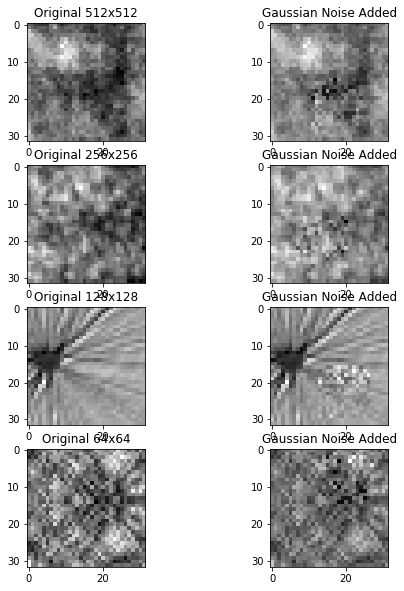

In [132]:
plt.figure(figsize=(8,10))

plt.subplot(4,2,1)
plt.title("Original 512x512")
plt.imshow(x_dagm_public_one_patches[500], cmap="gray")

plt.subplot(4,2,2)
plt.title("Gaussian Noise Added")
plt.imshow(x_dagm_public_one_patches_gaussian_noise[500], cmap="gray")

plt.subplot(4,2,3)
plt.title("Original 256x256")
plt.imshow(x_dagm_public_two_patches[500], cmap="gray")

plt.subplot(4,2,4)
plt.title("Gaussian Noise Added")
plt.imshow(x_dagm_public_two_patches_gaussian_noise[500], cmap="gray")

plt.subplot(4,2,5)
plt.title("Original 128x128")
plt.imshow(x_dagm_public_three_patches[500], cmap="gray")

plt.subplot(4,2,6)
plt.title("Gaussian Noise Added")
plt.imshow(x_dagm_public_three_patches_gaussian_noise[500], cmap="gray")

plt.subplot(4,2,7)
plt.title("Original 64x64")
plt.imshow(x_dagm_public_four_patches[500], cmap="gray")

plt.subplot(4,2,8)
plt.title("Gaussian Noise Added")
plt.imshow(x_dagm_public_four_patches_gaussian_noise[500], cmap="gray")

#### <font color = 'green'>Our DAGM Public data has been artifically corrupted and is now ready to be fed into our networks for training as out-of-class samples.<br><br> Features: 
- `x_dagm_public_one_patches_gaussian_noise` 512x512 images (12000, 32, 32)
- `x_dagm_public_two_patches_gaussian_noise` 256x256 images (6000, 32, 32)
- `x_dagm_public_three_patches_gaussian_noise` 128x128 images (3000, 32, 32)
- `x_dagm_public_four_patches_gaussian_noise` 64x64 images (1500, 32, 32)</font>

### 18. Building the Residual Block

In ResNets, a "shortcut" or a "skip connection" allows the gradient to be directly backpropagated to earlier layers, making easier to optimize deep networks. The following is the residual block setup and parameters that will be built:
![Residual Block](../figures/residual_block.png)

In [133]:
def residual_block(model, filters_num):
    main = Conv2D(filters_num, kernel_size=(5, 5), activation='elu', padding ='valid')(model) #L1
    main = Conv2D(filters_num, kernel_size=(1, 1), activation='linear', padding ='valid')(main) #L2
    shortcut = Cropping2D(cropping=((2, 2), (2, 2)))(model) #L3
    res_block = layers.add([shortcut, main]) #L4
    
    return res_block

### 19. Building the Residual-Based CNN

![Network Parameters](../figures/network_parameters.png)

In [134]:
def embedding_model(filters_num, inp):
    model = Conv2D(filters_num, kernel_size=(7, 7), activation='elu', padding = 'valid')(inp)
    model = MaxPool2D(pool_size = (2, 2), strides = (2, 2))(model)
    model = residual_block(model, filters_num)
    model = residual_block(model, filters_num)
    model = residual_block(model, filters_num)
    model = Conv2D(filters_num, kernel_size=(1, 1), activation='linear', padding = 'valid')(model)
    return model

##### Specifying arbitrary inputs to the model to test model build
Arbitrary inputs include shape 32x32x1 and 16 filters (units)

In [135]:
inp = Input((32,32,1)) #input_shape = (int(width), int(height), 1) where it should be 32 x 32 x 1
outp = embedding_model(16, inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

##### Building the model with the specified arbitrary inputs and viewing its summary to test model build

In [136]:
model = Model(inputs=inp, outputs=outp)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 26, 26, 16)   800         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 13, 13, 16)   0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 9, 9, 16)     6416        max_pooling2d_1[0][0]            
____________________________________________________________________________________________

##### Visualize Network to ensure correct model build

In [137]:
# os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
# plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

### (Defining the Triplet Loss. Not used in replicated paper but useful)

One popular architecture for deep metric learning are triplet networks. In this setup triplets consisting of three different images are fed into the CNN network we created in the previous sections. Two of these images belong to the same class and one image belongs to a different class. The network is then trained to create a feature space in which same-class samples have a lower distance to each other than to samples from other classes.

##### The Triplet Loss
Credits: Andrew Ng Coursera Convolutional Neural Networks Course https://www.coursera.org/learn/convolutional-neural-networks?specialization=deep-learning

![Triplet Loss](../figures/triplet_loss.png)

In [138]:
# def triplet_loss(y_true, y_pred, alpha = 0.2):
#     """
#     Implementation of the triplet loss
    
#     Arguments:
#     y_true -- true labels, required when you define a loss in Keras, you don't need it in this function.
#     y_pred -- python list containing three objects:
#             anchor -- the encodings for the anchor images, of shape (None, 128)
#             positive -- the encodings for the positive images, of shape (None, 128)
#             negative -- the encodings for the negative images, of shape (None, 128)
    
#     Returns:
#     loss -- real number, value of the loss
#     """
    
#     anchor, positive, negative = y_pred[0], y_pred[1], y_pred[2]
    
#     # Step 1: Compute the (encoding) distance between the anchor and the positive, you will need to sum over axis=-1
#     pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, positive)), axis=-1)
#     # Step 2: Compute the (encoding) distance between the anchor and the negative, you will need to sum over axis=-1
#     neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, negative)), axis=-1)
#     # Step 3: subtract the two previous distances and add alpha.
#     basic_loss = tf.add(tf.subtract(pos_dist, neg_dist), alpha)
#     # Step 4: Take the maximum of basic_loss and 0.0. Sum over the training examples.
#     loss = tf.reduce_sum(tf.maximum(basic_loss, 0))
    
#     return loss

In [139]:
def triplet_loss_two(inputs, dist='sqeuclidean', margin='maxplus'):
    anchor, positive, negative = inputs
    positive_distance = K.square(anchor - positive)
    negative_distance = K.square(anchor - negative)
    if dist == 'euclidean':
        positive_distance = K.sqrt(K.sum(positive_distance, axis=-1, keepdims=True))
        negative_distance = K.sqrt(K.sum(negative_distance, axis=-1, keepdims=True))
    elif dist == 'sqeuclidean':
        positive_distance = K.sum(positive_distance, axis=-1, keepdims=True)
        negative_distance = K.sum(negative_distance, axis=-1, keepdims=True)
    loss = positive_distance - negative_distance
    if margin == 'maxplus':
        loss = K.maximum(0.0, 1 + loss)
    elif margin == 'softplus':
        loss = K.log(1 + K.exp(loss))
    return K.mean(loss)

### 20. Building the Triplet/Siamese Network

![Triplet Network](../figures/triplet_network.png)

##### Function that calculates the Euclidean distance between two inputs

In [140]:
# def euclidean_distance_measure(outputs):
#     anchor, positive, negative = outputs
#     positive_distance = K.square(anchor - positive)
#     negative_distance = K.square(anchor - negative)
#     positive_distance = K.sqrt(K.sum(positive_distance, axis=-1, keepdims=True))
#     negative_distance = K.sqrt(K.sum(negative_distance, axis=-1, keepdims=True))
#     return positive_distance, negative_distance

In [143]:
def euclidean_distance(vects):
    x, y = vects
    #sum_square = K.sum(K.square(x - y), axis=1, keepdims=True)
    sum_square = K.sum(K.square(x - y), axis=-1)#, keepdims=True)
    return K.sqrt(sum_square)


def eucl_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0], 1)

##### Function that calculates the softmax values for each sets of scores in x

In [141]:
# def softmax(x):
#     """Compute softmax values for each sets of scores in x."""
#     return tf.exp(x) / tf.reduce_sum(tf.exp(x))

##### Function that defines the Triplet Model Architecture + Calculates Inputs Euclidean distances + Computes their Softmax Values

In [145]:
# def get_siamese_model(input_shape, filters_num):
#     """
#         Model architecture
#     """
#     np.random.seed(1)
    
#     # Define the tensors for the triplet of input images
#     anchor_input = Input(input_shape, name="anchor_input")
#     positive_input = Input(input_shape, name="positive_input")
#     negative_input = Input(input_shape, name="negative_input")
    
#     # Generate the embedding outputs from Convolutional Neural Network
#     anchor_output = embedding_model(filters_num, anchor_input)
#     positive_output = embedding_model(filters_num, positive_input)
#     negative_output = embedding_model(filters_num, negative_input)
    
#     # Generating models inputs and outputs
#     inputs = [anchor_input, positive_input, negative_input]
#     outputs = [anchor_output, positive_output, negative_output]
    
#     # Connect the inputs with the outputs
#     siamese_triplet = Model(inputs=inputs,outputs=outputs)
    
#     # Calculate Euclidean Distance between anchor and positive & anchor and negative
#     positive_distance, negative_distance = euclidean_distance_measure(outputs)
#     print(positive_distance.eval)
#     print(negative_distance.eval)
    
#     # Softmax the distances to get a ratio measure
#     softmax_result = softmax([positive_distance, negative_distance])
#     print(softmax_result.eval)
    
#     # Computing MAE Loss
# #     y_true_one = np.array([[[[[0]]]]])
# #     y_true_two = np.array([[[[[1]]]]])
# #     print(y_true_one.shape)
# #     print(y_true_two.shape)
# #     y_true = np.concatenate((y_true_one,  y_true_two))
# #     loss = positive_distance - negative_distance
# #     if margin == 'maxplus':
# #         loss = K.maximum(0.0, 1 + loss)


#     # if y_true = softmax([positive_distance, negative_distance]) == LOSS 0 WHICH IS EXPECTED
#     y_true = softmax([0 * positive_distance, negative_distance]) #Custom Loss
#     #y_true = [0 * positive_distance, tf.add((0 * negative_distance),1)]
#     #print(y_true.shape)
#     #y_true = tf.convert_to_tensor(y_true)
#     #print(y_true.eval)
#     #y_true = [0,1]
#     #print(y_true.shape)
    
# #     if softmax_result[0] > softmax_result[1]:
# #         y_pred = [0,1]
# #     else:
# #         y_pred = [1,0]
    
#     #x = tf.constant(2)
#     #y = tf.constant(5)
# #     def f1(): return [0,1]
# #     def f2(): return [1,0]
# #     y_pred = tf.cond(tf.less(positive_distance, negative_distance), f1, f2)
    
#     y_pred = softmax_result
#     #print(y_pred.eval)
#     #print(y_pred.shape)
    
#     loss = tf.keras.losses.mean_absolute_error(y_true, y_pred)
#     print(loss.eval)
    
#     siamese_triplet.add_loss(loss)
    
#     #siamese_triplet.add_loss((triplet_loss_two(outputs, dist='euclidean', margin='maxplus'))) #Triplet Loss
#     #siamese_triplet.add_loss((triplet_loss(y_pred=outputs, y_true=(None,None,None))))
    
#     # return the model
#     return siamese_triplet

##### Function that defines the Triplet Model Architecture 

In [142]:
def get_siamese_model(input_shape, filters_num):
    """
        Model architecture
    """
    np.random.seed(1)
    
    # Define the tensors for the triplet of input images
    anchor_input = Input(input_shape, name="anchor_input")
    positive_input = Input(input_shape, name="positive_input")
    negative_input = Input(input_shape, name="negative_input")
    
    # Generate the embedding outputs from Convolutional Neural Network
    anchor_output = embedding_model(filters_num, anchor_input)
    positive_output = embedding_model(filters_num, positive_input)
    negative_output = embedding_model(filters_num, negative_input)
    
    # Generating models inputs and outputs
    inputs = [anchor_input, positive_input, negative_input]
    outputs = [anchor_output, positive_output, negative_output]
    
    # Connect the inputs with the outputs
    siamese_triplet = Model(inputs=inputs,outputs=outputs)
    
    return siamese_triplet

##### Function that calculates the mean absolute error loss

In [144]:
def dense_loss(y_true, y_pred):
    
    anchor, positive, negative = y_pred[0], y_pred[1], y_pred[2]
    #anchor, positive, negative = y_pred
    
    
    pos_dist = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([anchor, positive])
    print('+/-ve Distance shape = ', pos_dist.shape)
    neg_dist = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([anchor, negative])
    
    distances = Concatenate(axis=-1)([pos_dist, neg_dist])#, axis=-1)
    print('Distances shape =' , distances)
    
    output = Dense(2, activation='softmax', kernel_initializer = glorot_uniform(seed=0))(distances)
    print('Dense output shape = ', output.shape)
    print('Dense output[0] shape = ', output[0].shape)
    
    y_true = np.array([[0.0, 1.0]])
    y_true = y_true.astype('float32')
    print('Target shape = ', y_true.shape)
    print('Target [0] shape = ', y_true[0].shape)
    y_true = tf.convert_to_tensor(y_true)
    print('y_true.shape = ', y_true)

    loss = tf.keras.losses.mean_absolute_error(output, y_true)
    #assert loss.shape == (1,)
    print('Dense Loss shape = ', loss.shape)
    return loss

### 21. Preparing Triplets

Before utilizing the Triplet network, the CNN is first trained to learn similarities between patches of 32x32 pixels sampled at random positions. We will now prepare the triplets to be fed into our training network.

- Each patch from each class image is now its own class
- Patches from the same class will be used as the anchor and positive images, while the patches from the images with gaussian noise will be used as the negative images

##### Recall the data to be used

#### <font color = 'green'>Our Kyleberg data<br><br> Features: 
- `x_kyleberg_normalized_one_patches` 512x512 images (17920, 32, 32)
- `x_kyleberg_normalized_two_patches` 256x256 images (8960, 32, 32)
- `x_kyleberg_normalized_three_patches` 128x128 images (4480, 32, 32)
- `x_kyleberg_normalized_four_patches` 64x64 images (2240, 32, 32) </font>

#### <font color = 'green'>Images with Gaussian Noise: 
- `x_kyleberg_normalized_one_patches_gaussian_noise` 512x512 images (17920, 32, 32)
- `x_kyleberg_normalized_two_patches_gaussian_noise` 256x256 images (8960, 32, 32)
- `x_kyleberg_normalized_three_patches_gaussian_noise` 128x128 images (4480, 32, 32)
- `x_kyleberg_normalized_four_patches_gaussian_noise` 64x64 images (2240, 32, 32)</font>

#### <font color = 'green'>Target:
- `y_kyleberg_one_patches` 512x512 images (17920,)
- `y_kyleberg_two_patches` 256x256 images (8960,)
- `y_kyleberg_three_patches` 128x128 images (4480,)
- `y_kyleberg_four_patches` 64x64 images (2240,)

#### <font color = 'green'>Our DAGM Public data<br><br> Features: 
- `x_dagm_public_one_patches` 512x512 images (12000, 32, 32)
- `x_dagm_public_two_patches` 256x256 images (6000, 32, 32)
- `x_dagm_public_three_patches` 128x128 images (3000, 32, 32)
- `x_dagm_public_four_patches` 64x64 images (1500, 32, 32)</font>

#### <font color = 'green'>Images with Gaussian Noise: 
- `x_dagm_public_one_patches_gaussian_noise` 512x512 images (12000, 32, 32)
- `x_dagm_public_two_patches_gaussian_noise` 256x256 images (6000, 32, 32)
- `x_dagm_public_three_patches_gaussian_noise` 128x128 images (3000, 32, 32)
- `x_dagm_public_four_patches_gaussian_noise` 64x64 images (1500, 32, 32)</font>

#### <font color = 'green'>Target:
- `y_dagm_public_one_patches` 512x512 images (12000,)
- `y_dagm_public_two_patches` 256x256 images (6000,)
- `y_dagm_public_three_patches` 128x128 images (3000,)
- `y_dagm_public_four_patches` 64x64 images (1500,)

#### <font color = 'green'>Our CIFAR100 data<br><br> Features: `x_cifar_gray_normalized`</font>

#### <font color = 'green'>Target: `y_cifar`</font>

##### Expanding Dimensions from 3D to 4D to all features

In [146]:
#Kyleberg
x_kyleberg_normalized_one_patches = np.expand_dims(x_kyleberg_normalized_one_patches, 3)
x_kyleberg_normalized_two_patches = np.expand_dims(x_kyleberg_normalized_two_patches, 3)
x_kyleberg_normalized_three_patches = np.expand_dims(x_kyleberg_normalized_three_patches, 3)
x_kyleberg_normalized_four_patches = np.expand_dims(x_kyleberg_normalized_four_patches, 3)


#DAGM Public
x_dagm_public_one_patches = np.expand_dims(x_dagm_public_one_patches, 3)
x_dagm_public_two_patches = np.expand_dims(x_dagm_public_two_patches, 3)
x_dagm_public_three_patches = np.expand_dims(x_dagm_public_three_patches, 3)
x_dagm_public_four_patches = np.expand_dims(x_dagm_public_four_patches, 3)

#CIFAR100
x_cifar_gray_normalized = np.expand_dims(x_cifar_gray_normalized, 3)

In [147]:
x_kyleberg_normalized_one_gaussian_noise_patches = np.expand_dims(x_kyleberg_normalized_one_patches_gaussian_noise, 3)
x_kyleberg_normalized_two_gaussian_noise_patches = np.expand_dims(x_kyleberg_normalized_two_patches_gaussian_noise, 3)
x_kyleberg_normalized_three_gaussian_noise_patches = np.expand_dims(x_kyleberg_normalized_three_patches_gaussian_noise, 3)
x_kyleberg_normalized_four_gaussian_noise_patches = np.expand_dims(x_kyleberg_normalized_four_patches_gaussian_noise, 3)

x_dagm_public_one_patches_gaussian_noise = np.expand_dims(x_dagm_public_one_patches_gaussian_noise, 3)
x_dagm_public_two_patches_gaussian_noise = np.expand_dims(x_dagm_public_two_patches_gaussian_noise, 3)
x_dagm_public_three_patches_gaussian_noise = np.expand_dims(x_dagm_public_three_patches_gaussian_noise, 3)
x_dagm_public_four_patches_gaussian_noise = np.expand_dims(x_dagm_public_four_patches_gaussian_noise, 3)

In [148]:
print(x_kyleberg_normalized_one_patches.shape)
print(x_kyleberg_normalized_two_patches.shape)
print(x_kyleberg_normalized_three_patches.shape)
print(x_kyleberg_normalized_four_patches.shape)

(17920, 32, 32, 1)
(8960, 32, 32, 1)
(4480, 32, 32, 1)
(2240, 32, 32, 1)


In [149]:
# x_kyleberg_normalized_one_patches = np.reshape(x_kyleberg_normalized_one_patches, (5600, 32, 32, 1))
# x_kyleberg_normalized_two_patches = np.reshape(x_kyleberg_normalized_two_patches, (3360, 32, 32, 1))
# x_kyleberg_normalized_three_patches = np.reshape(x_kyleberg_normalized_three_patches, (2240, 32, 32, 1))
# x_kyleberg_normalized_four_patches = np.reshape(x_kyleberg_normalized_four_patches, (1120, 32, 32, 1))

##### Kyleberg: Generate Triplets

In [150]:
#Should be 40 samples per class rather than 20, but there is an unequal split per class so 20 is safe
x_kyleberg_one_triplets, y_kyleberg_one_triplets = generate_triplets(x_kyleberg_normalized_one_patches, y_kyleberg_one_patches , 448, 20, x_kyleberg_normalized_one_gaussian_noise_patches)
x_kyleberg_two_triplets, y_kyleberg_two_triplets = generate_triplets(x_kyleberg_normalized_two_patches, y_kyleberg_two_patches , 224, 20, x_kyleberg_normalized_two_gaussian_noise_patches)
x_kyleberg_three_triplets, y_kyleberg_three_triplets = generate_triplets(x_kyleberg_normalized_three_patches, y_kyleberg_three_patches , 112, 20, x_kyleberg_normalized_three_gaussian_noise_patches)
x_kyleberg_four_triplets, y_kyleberg_four_triplets = generate_triplets(x_kyleberg_normalized_four_patches, y_kyleberg_four_patches , 56, 20, x_kyleberg_normalized_four_gaussian_noise_patches)

##### DAGM Public: Generate Triplets

In [151]:
#Should be 125 samples per class rather than 75, but there is an unequal split per class so 75 is safe
x_dagm_public_one_triplets, y_dagm_public_one_triplets = generate_triplets(x_dagm_public_one_patches, y_dagm_public_one_patches , 96, 75, x_dagm_public_one_patches_gaussian_noise)
x_dagm_public_two_triplets, y_dagm_public_two_triplets = generate_triplets(x_dagm_public_two_patches, y_dagm_public_two_patches , 48, 75, x_dagm_public_two_patches_gaussian_noise)
x_dagm_public_three_triplets, y_dagm_public_three_triplets = generate_triplets(x_dagm_public_three_patches, y_dagm_public_three_patches , 24, 75, x_dagm_public_three_patches_gaussian_noise)
x_dagm_public_four_triplets, y_dagm_public_four_triplets = generate_triplets(x_dagm_public_four_patches, y_dagm_public_four_patches , 12, 75, x_dagm_public_four_patches_gaussian_noise)

##### CIFAR100: Generate Triplets

In [152]:
#Should be 600 samples per class instead of 100, but memory limitations
x_cifar_triplets, y_cifar_triplets = generate_triplets(x_cifar_gray_normalized, y_cifar, 100, 100, np.array(False))

##### Kyleberg: Print Triplets Shape

In [153]:
x_kyleberg_one_triplets[0].shape
x_kyleberg_two_triplets[0].shape
x_kyleberg_three_triplets[0].shape
x_kyleberg_four_triplets[0].shape

(8960, 32, 32, 1)

(4480, 32, 32, 1)

(2240, 32, 32, 1)

(1120, 32, 32, 1)

##### DAGM Public: Print Triplets Shape

In [154]:
x_dagm_public_one_triplets[0].shape
x_dagm_public_two_triplets[0].shape
x_dagm_public_three_triplets[0].shape
x_dagm_public_four_triplets[0].shape

(7200, 32, 32, 1)

(3600, 32, 32, 1)

(1800, 32, 32, 1)

(900, 32, 32, 1)

##### CIFAR100: Print Triplets Shape

In [155]:
x_cifar_triplets[0].shape

(10000, 32, 32, 1)

##### Kyleberg: Visualize Sample Triplets

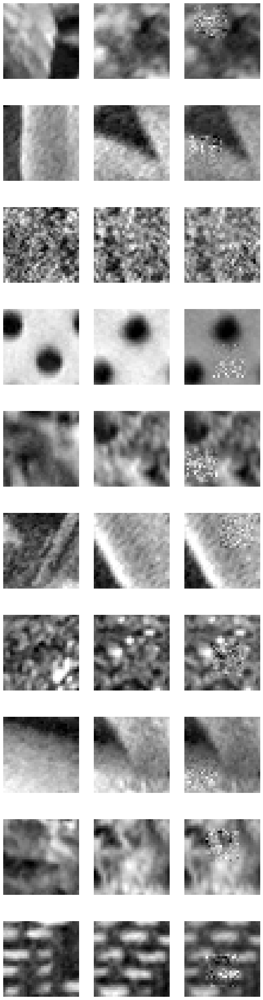

In [156]:
visualize_triplet_data(x_kyleberg_one_triplets, 10)

##### DAGM Public: Visualize Sample Triplets

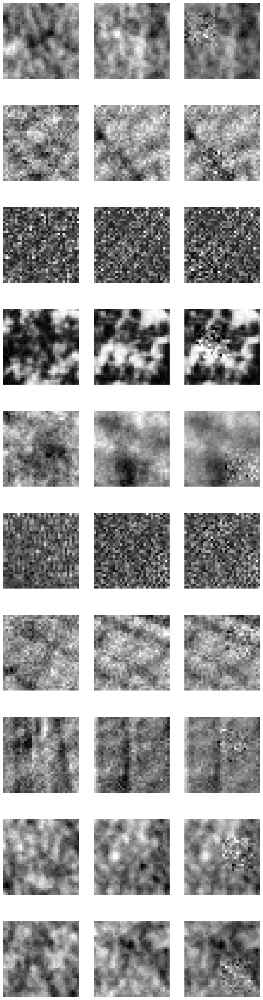

In [157]:
visualize_triplet_data(x_dagm_public_one_triplets, 10)

##### CIFAR100: Visualize Sample Triplets

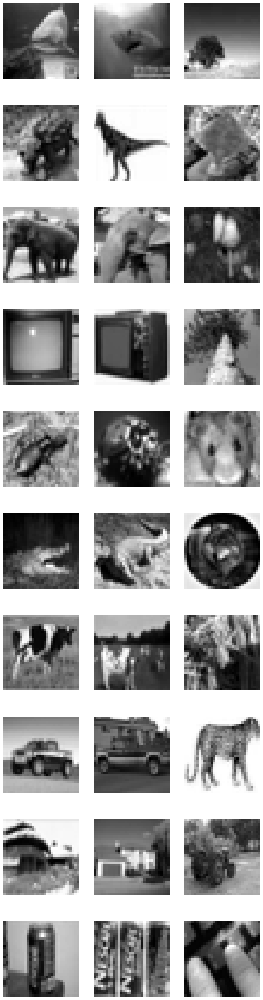

In [158]:
visualize_triplet_data(x_cifar_triplets, 10)

In [214]:
# print(x_cifar_triplets[0].shape)
# print(len(x_cifar_triplets[0]))
# n = min(len(x_cifar_triplets[0]), 10)
# random_choices = np.random.choice(len(x_cifar_triplets[0]),n, replace=False)
# print (random_choices)

# anc, pos, neg = x_cifar_triplets[0], x_cifar_triplets[1], x_cifar_triplets[2]
# print(len(anc))
# print(neg[0].shape)
# print(pos[0].shape)
# print(anc[0].shape)
# print(neg[0])

# anc, pos, neg = x_cifar_triplets
# print(len(anc))
# print(neg[0].shape)
# print(pos[0].shape)
# print(anc[0].shape)

In [215]:
save_variables(x_kyleberg_one_triplets, 'x_kyleberg_one_triplets')
save_variables(x_kyleberg_two_triplets, 'x_kyleberg_two_triplets')
save_variables(x_kyleberg_three_triplets, 'x_kyleberg_three_triplets')
save_variables(x_kyleberg_four_triplets, 'x_kyleberg_four_triplets')

save_variables(x_dagm_public_one_triplets, 'x_dagm_public_one_triplets')
save_variables(x_dagm_public_two_triplets, 'x_dagm_public_two_triplets')
save_variables(x_dagm_public_three_triplets, 'x_dagm_public_three_triplets')
save_variables(x_dagm_public_four_triplets, 'x_dagm_public_four_triplets')

save_variables(x_cifar_triplets, 'x_cifar_triplets')

In [38]:
x_kyleberg_one_triplets = load_variables('x_kyleberg_one_triplets')
x_kyleberg_two_triplets = load_variables('x_kyleberg_two_triplets')
x_kyleberg_three_triplets = load_variables('x_kyleberg_three_triplets')
x_kyleberg_four_triplets = load_variables('x_kyleberg_four_triplets')

x_dagm_public_one_triplets = load_variables('x_dagm_public_one_triplets')
x_dagm_public_two_triplets = load_variables('x_dagm_public_two_triplets')
x_dagm_public_three_triplets = load_variables('x_dagm_public_three_triplets')
x_dagm_public_four_triplets = load_variables('x_dagm_public_four_triplets')

x_cifar_triplets = load_variables('x_cifar_triplets')

#### <font color = 'green'>Triplets to be fed into our training network:<br><br>

#### <font color = 'green'>Kyleberg data<br><br> Features: 
- `x_kyleberg_one_triplets` 
- `x_kyleberg_two_triplets` 
- `x_kyleberg_three_triplets`
- `x_kyleberg_four_triplets` </font>

#### <font color = 'green'>Target:
- `y_kyleberg_one_triplets` 
- `y_kyleberg_two_triplets` 
- `y_kyleberg_three_triplets` 
- `y_kyleberg_four_triplets` 

#### <font color = 'green'>DAGM Public data<br><br> Features: 
- `x_dagm_public_one_triplets` 
- `x_dagm_public_two_triplets` 
- `x_dagm_public_three_triplets`
- `x_dagm_public_four_triplets` </font>

#### <font color = 'green'>Target:
- `y_dagm_public_one_triplets` 
- `y_dagm_public_two_triplets` 
- `y_dagm_public_three_triplets` 
- `y_dagm_public_four_triplets` 

#### <font color = 'green'>CIFAR100 data<br><br> Features: 
- `x_cifar_triplets` </font>

#### <font color = 'green'>Target:
- `y_cifar_triplets` </font>

### 22. Training the Residual-Based CNN

The CNN is now trained on the triplets generated in the previous section. 4 different models will be trained here exactly as performed in the paper, to be later evaluated against each other. These models include:

1. Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 16 units (Conv2D filters)
2. Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 16 units (Conv2D filters) + CIFAR100 Dataset
3. Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 32 units (Conv2D filters)
4. Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 32 units (Conv2D filters) + CIFAR100 Dataset

#### Model 1: Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 16 units (Conv2D filters)

In [159]:
# np.random.seed(0)
# tf.random.set_seed(0)
model_one = get_siamese_model((32,32,1), 16)
model_one.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
anchor_input (InputLayer)       (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
positive_input (InputLayer)     (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
negative_input (InputLayer)     (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 26, 26, 16)   800         anchor_input[0][0]               
____________________________________________________________________________________________

In [160]:
model_one.compile(loss=dense_loss, optimizer=Adam(0.0001))
#model_one.compile(loss=None, optimizer=Adam(0.0001))
#loss = "mean_absolute_error"

+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss/conv2d_16_loss/dense_loss/concatenate_1/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss/conv2d_16_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss/conv2d_24_loss/dense_loss/concatenate_2/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss/conv2d_24_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss/conv2d_32_loss/dense_loss/concatenate_3/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape = 

In [3]:
history_one = model_one.fit(x=x_kyleberg_one_triplets, y=x_kyleberg_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_kyleberg_two_triplets, y=x_kyleberg_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_kyleberg_three_triplets, y=x_kyleberg_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_kyleberg_four_triplets, y=x_kyleberg_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)

In [4]:
history_one = model_one.fit(x=x_dagm_public_one_triplets, y=x_dagm_public_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_dagm_public_two_triplets, y=x_dagm_public_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_dagm_public_three_triplets, y=x_dagm_public_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)
history_one = model_one.fit(x=x_dagm_public_four_triplets, y=x_dagm_public_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
plot_history_loss(history_one)

In [56]:
# plt.plot(history_one.history["loss"])
# plt.title('Model Loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train'], loc='upper left')
# plt.show()

In [78]:
# serialize weights to HDF5
#model_one.save_weights('../Models/model_one_weights.h5')
#model_one.save_weights('../Models/model_one_weights_triplet_loss.h5')
# model_one.save_weights('../Models/model_one_weights_custom_loss.h5')
model_one.save_weights('../Models/model_one_weights_dense_loss.h5')
#model_one.save_weights('../Models/model_one_weights_dense_loss_squared.h5')
print("Saved model's weights to disk")

Saved model's weights to disk


#### Model 2: Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 16 units (Conv2D filters) + CIFAR100 Dataset

In [93]:
# np.random.seed(0)
# tf.random.set_seed(0)
model_two = get_siamese_model((32,32,1), 16)
model_two.compile(loss=dense_loss, optimizer=Adam(0.0001))

+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_9/conv2d_224_loss/dense_loss/concatenate_28/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_9/conv2d_224_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_9/conv2d_232_loss/dense_loss/concatenate_29/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_9/conv2d_232_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_9/conv2d_240_loss/dense_loss/concatenate_30/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2

In [5]:
history_two = model_two.fit(x=x_cifar_triplets, y=x_cifar_triplets, shuffle=True, validation_split=.1, batch_size=256, epochs=15)
plot_history_loss(history_two)

In [6]:
history_two = model_two.fit(x=x_kyleberg_one_triplets, y=x_kyleberg_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_kyleberg_two_triplets, y=x_kyleberg_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_kyleberg_three_triplets, y=x_kyleberg_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_kyleberg_four_triplets, y=x_kyleberg_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [7]:
history_two = model_two.fit(x=x_dagm_public_one_triplets, y=x_dagm_public_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_dagm_public_two_triplets, y=x_dagm_public_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_dagm_public_three_triplets, y=x_dagm_public_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_two = model_two.fit(x=x_dagm_public_four_triplets, y=x_dagm_public_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [83]:
# serialize weights to HDF5
#model_two.save_weights('../Models/model_two_weights_custom_loss.h5')
model_two.save_weights('../Models/model_two_weights_dense_loss.h5')
#model_two.save_weights('../Models/model_two_weights_dense_loss_squared.h5')
print("Saved model's weights to disk")

Saved model's weights to disk


#### Model 3: Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 32 units (Conv2D filters)

In [210]:
# np.random.seed(0)
# tf.random.set_seed(0)
model_three = get_siamese_model((32,32,1), 32)
model_three.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
anchor_input (InputLayer)       (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
positive_input (InputLayer)     (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
negative_input (InputLayer)     (None, 32, 32, 1)    0                                            
__________________________________________________________________________________________________
conv2d_153 (Conv2D)             (None, 26, 26, 32)   1600        anchor_input[0][0]               
____________________________________________________________________________________________

In [211]:
model_three.compile(loss=dense_loss, optimizer=Adam(0.0001))

+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_10/conv2d_160_loss/dense_loss/concatenate_21/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_10/conv2d_160_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_10/conv2d_168_loss/dense_loss/concatenate_22/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_10/conv2d_168_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_10/conv2d_176_loss/dense_loss/concatenate_23/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape 

In [1]:
history_three = model_three.fit(x=x_kyleberg_one_triplets, y=x_kyleberg_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_kyleberg_two_triplets, y=x_kyleberg_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_kyleberg_three_triplets, y=x_kyleberg_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_kyleberg_four_triplets, y=x_kyleberg_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [2]:
history_three = model_three.fit(x=x_dagm_public_one_triplets, y=x_dagm_public_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_dagm_public_two_triplets, y=x_dagm_public_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_dagm_public_three_triplets, y=x_dagm_public_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_three = model_three.fit(x=x_dagm_public_four_triplets, y=x_dagm_public_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [216]:
# serialize weights to HDF5
#model_three.save_weights('../Models/model_three_weights_custom_loss.h5')
model_three.save_weights('../Models/model_three_weights_dense_loss.h5')
print("Saved model's weights to disk")

Saved model's weights to disk


#### Model 4: Kylberg Texture Dataset + DAGM Public Dataset (500 non-defect) + 32 units (Conv2D filters) + CIFAR100 Dataset

In [199]:
# np.random.seed(0)
# tf.random.set_seed(0)
model_four = get_siamese_model((32,32,1), 32)

In [200]:
model_four.compile(loss=dense_loss, optimizer=Adam(0.0001))

+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_8/conv2d_112_loss/dense_loss/concatenate_15/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_8/conv2d_112_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_8/conv2d_120_loss/dense_loss/concatenate_16/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2,)
y_true.shape =  Tensor("loss_8/conv2d_120_loss/dense_loss/Const:0", shape=(1, 2), dtype=float32)
Dense Loss shape =  (1,)
+/-ve Distance shape =  (1, 1)
Distances shape = Tensor("loss_8/conv2d_128_loss/dense_loss/concatenate_17/concat:0", shape=(1, 2), dtype=float32)
Dense output shape =  (1, 2)
Dense output[0] shape =  (2,)
Target shape =  (1, 2)
Target [0] shape =  (2

In [3]:
history_four = model_four.fit(x=x_cifar_triplets, y=x_cifar_triplets, shuffle=True, validation_split=.1, batch_size=256, epochs=15)

In [4]:
history_four = model_four.fit(x=x_kyleberg_one_triplets, y=x_kyleberg_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_kyleberg_two_triplets, y=x_kyleberg_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_kyleberg_three_triplets, y=x_kyleberg_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_kyleberg_four_triplets,  y=x_kyleberg_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [5]:
history_four = model_four.fit(x=x_dagm_public_one_triplets, y=x_dagm_public_one_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_dagm_public_two_triplets, y=x_dagm_public_two_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_dagm_public_three_triplets, y=x_dagm_public_three_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 
history_four = model_four.fit(x=x_dagm_public_four_triplets, y=x_dagm_public_four_triplets, shuffle=True, batch_size=256, validation_split=.1, epochs=15) 

In [204]:
# serialize weights to HDF5
# model_four.save_weights('../Models/model_four_weights_custom_loss.h5')
model_four.save_weights('../Models/model_four_weights_dense_loss.h5')
print("Saved model's weights to disk")

Saved model's weights to disk


### 23. Prototype

##### Splitting the DAGM Public images into their respective classes for prototype training

In [61]:
prototype_dagm_one_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 0)
prototype_dagm_two_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 1)
prototype_dagm_three_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 2)
prototype_dagm_four_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 3)
prototype_dagm_five_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 4)
prototype_dagm_six_normalized = split_classes(x_dagm_public_non_defective_test_normalized, y_dagm_public_non_defective_test, 5)

(500, 512, 512, 1)
(500, 512, 512, 1)


#### Model 1 Prototype

In [87]:
# np.random.seed(0)
# tf.random.set_seed(0)
prototype_inp = Input((512,512,1)) 
prototype_outp = embedding_model(16, prototype_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

In [88]:
prototype_model_one = Model(inputs=prototype_inp, outputs=prototype_outp)
prototype_model_one.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 506, 506, 16) 800         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_2 (MaxPooling2D)  (None, 253, 253, 16) 0           conv2d_9[0][0]                   
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 249, 249, 16) 6416        max_pooling2d_2[0][0]            
____________________________________________________________________________________________

In [89]:
# model_one_weights_list = model_one.get_weights()
# for i in range(len(model_one_weights_list)):
#     print(model_one_weights_list[i].shape)

In [90]:
#prototype_model_one.load_weights('../Models/model_one_weights.h5', by_name="True")
#prototype_model_one.load_weights('../Models/model_one_weights_triplet_loss.h5', by_name="True")
#prototype_model_one.load_weights('../Models/model_one_weights_custom_loss.h5', by_name="True")
#prototype_model_one.load_weights('../Models/model_one_weights_dense_loss.h5', by_name="True")
prototype_model_one.load_weights('../Models/model_one_weights_dense_loss_squared.h5', by_name="True")
#prototype_model_one.set_weights(model_one.get_weights())

In [66]:
# prototype_one_weights_list = prototype_model_one.get_weights()
# for i in range(len(prototype_one_weights_list)):
#     print(prototype_one_weights_list[i].shape)

In [67]:
# prediction_one = prototype_model_one.predict([prototype_dagm_one_normalized[0:100]])
# print(prediction_one.shape)
# prediction_two = prototype_model_one.predict([prototype_dagm_two_normalized[0:100]])
# prediction_three = prototype_model_one.predict([prototype_dagm_three_normalized[0:100]])
# prediction_four = prototype_model_one.predict([prototype_dagm_four_normalized[0:100]])
# prediction_five = prototype_model_one.predict([prototype_dagm_five_normalized[0:100]])
# prediction_six = prototype_model_one.predict([prototype_dagm_six_normalized[0:100]])

prediction_one = prototype_model_one.predict([prototype_dagm_one_normalized])
print(prediction_one.shape)
prediction_two = prototype_model_one.predict([prototype_dagm_two_normalized])
prediction_three = prototype_model_one.predict([prototype_dagm_three_normalized])
prediction_four = prototype_model_one.predict([prototype_dagm_four_normalized])
prediction_five = prototype_model_one.predict([prototype_dagm_five_normalized])
prediction_six = prototype_model_one.predict([prototype_dagm_six_normalized])

(100, 241, 241, 16)


In [64]:
#prediction_seven = prototype_model_one.predict([prototype_dagm_comp_seven_normalized[]])
# prediction_eight = prototype_model_one.predict([prototype_dagm_comp_eight_normalized[0:100]])
# prediction_nine = prototype_model_one.predict([prototype_dagm_comp_nine_normalized[0:100]])
# prediction_ten = prototype_model_one.predict([prototype_dagm_comp_ten_normalized[0:100]])

In [68]:
model_one_prototype_mean_one = prototype_mean_and_max(prediction_one)
model_one_prototype_mean_two = prototype_mean_and_max(prediction_two)
model_one_prototype_mean_three = prototype_mean_and_max(prediction_three)
model_one_prototype_mean_four = prototype_mean_and_max(prediction_four)
model_one_prototype_mean_five = prototype_mean_and_max(prediction_five)
model_one_prototype_mean_six = prototype_mean_and_max(prediction_six)

Mean Shape: (241, 241, 16)
Max Mean Value: 0.8756723
Mean Shape: (241, 241, 16)
Max Mean Value: 0.60061103


In [95]:
model_one_prototype_mean_seven = prototype_mean_and_max(prediction_seven)
# model_one_prototype_mean_eight = prototype_mean_and_max(prediction_eight)
# model_one_prototype_mean_nine = prototype_mean_and_max(prediction_nine)
# model_one_prototype_mean_ten = prototype_mean_and_max(prediction_ten)

# M_norm = []
# N_norm = []
# r = len(prediction)
# for i in range(r):
#     d = tf.reduce_sum(tf.square(tf.subtract(prediction[i], ptype)), axis=-1)
#     m = np.max(d)
#     n = np.mean(d)
#     M_norm.append(np.squeeze(np.asarray(m)))
#     N_norm.append(np.squeeze(np.asarray(n)))
# d_norm_max = np.asarray(M_norm, dtype="float") 
# d_norm_mean = np.asarray(N_norm, dtype="float") 
# threshold = np.mean(d_norm_max)
# print("Threshold =", threshold)

Mean Shape: (241, 241, 16)
Max Mean Value: 1.0013796
Mean Shape: (241, 241, 16)
Max Mean Value: 0.9027505
Mean Shape: (241, 241, 16)
Max Mean Value: 0.22406726
Mean Shape: (241, 241, 16)
Max Mean Value: 0.8861351


#### Model 2 Prototype

In [77]:
# np.random.seed(0)
# tf.random.set_seed(0)
prototype_inp = Input((512,512,1)) 
prototype_outp = embedding_model(16, prototype_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

In [78]:
prototype_model_two = Model(inputs=prototype_inp, outputs=prototype_outp)
prototype_model_two.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_17 (Conv2D)              (None, 506, 506, 16) 800         input_3[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_3 (MaxPooling2D)  (None, 253, 253, 16) 0           conv2d_17[0][0]                  
__________________________________________________________________________________________________
conv2d_18 (Conv2D)              (None, 249, 249, 16) 6416        max_pooling2d_3[0][0]            
____________________________________________________________________________________________

In [79]:
prototype_model_two.load_weights('../Models/model_two_weights_custom_loss.h5', by_name="True")

In [80]:
# prediction_one = prototype_model_two.predict([prototype_dagm_one_normalized[0:100]])
# print(prediction_one.shape)
# prediction_two = prototype_model_two.predict([prototype_dagm_two_normalized[0:100]])
# prediction_three = prototype_model_two.predict([prototype_dagm_three_normalized[0:100]])
# prediction_four = prototype_model_two.predict([prototype_dagm_four_normalized[0:100]])
# prediction_five = prototype_model_two.predict([prototype_dagm_five_normalized[0:100]])
# prediction_six = prototype_model_two.predict([prototype_dagm_six_normalized[0:100]])

prediction_one = prototype_model_two.predict([prototype_dagm_one_normalized])
print(prediction_one.shape)
prediction_two = prototype_model_two.predict([prototype_dagm_two_normalized])
prediction_three = prototype_model_two.predict([prototype_dagm_three_normalized])
prediction_four = prototype_model_two.predict([prototype_dagm_four_normalized])
prediction_five = prototype_model_two.predict([prototype_dagm_five_normalized])
prediction_six = prototype_model_two.predict([prototype_dagm_six_normalized])

In [140]:
prediction_seven = prototype_model_two.predict([prototype_dagm_comp_seven_normalized[0:100]])
prediction_eight = prototype_model_two.predict([prototype_dagm_comp_eight_normalized[0:100]])
prediction_nine = prototype_model_two.predict([prototype_dagm_comp_nine_normalized[0:100]])
prediction_ten = prototype_model_two.predict([prototype_dagm_comp_ten_normalized[0:100]])

In [81]:
model_two_prototype_mean_one = prototype_mean_and_max(prediction_one)
model_two_prototype_mean_two = prototype_mean_and_max(prediction_two)
model_two_prototype_mean_three = prototype_mean_and_max(prediction_three)
model_two_prototype_mean_four = prototype_mean_and_max(prediction_four)
model_two_prototype_mean_five = prototype_mean_and_max(prediction_five)
model_two_prototype_mean_six = prototype_mean_and_max(prediction_six)

Mean Shape: (241, 241, 16)
Max Mean Value: 0.7250131


In [141]:
model_two_prototype_mean_seven = prototype_mean_and_max(prediction_seven)
model_two_prototype_mean_eight = prototype_mean_and_max(prediction_eight)
model_two_prototype_mean_nine = prototype_mean_and_max(prediction_nine)
model_two_prototype_mean_ten = prototype_mean_and_max(prediction_ten)

Mean Shape: (241, 241, 16)
Max Mean Value: 1.1038741
Mean Shape: (241, 241, 16)
Max Mean Value: 0.89123803
Mean Shape: (241, 241, 16)
Max Mean Value: 0.19186148
Mean Shape: (241, 241, 16)
Max Mean Value: 0.7737391


#### Model 3 Prototype

In [54]:
# np.random.seed(0)
# tf.random.set_seed(0)
prototype_inp = Input((512,512,1)) 
prototype_outp = embedding_model(32, prototype_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

In [55]:
prototype_model_three = Model(inputs=prototype_inp, outputs=prototype_outp)
prototype_model_three.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 506, 506, 32) 1600        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 253, 253, 32) 0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 249, 249, 32) 25632       max_pooling2d_1[0][0]            
____________________________________________________________________________________________

In [59]:
prototype_model_three.load_weights('../Models/model_three_weights_custom_loss.h5', by_name="True")

In [1]:
prediction_one = prototype_model_three.predict([prototype_dagm_one_normalized[0:100]])
print(prediction_one.shape)
prediction_two = prototype_model_three.predict([prototype_dagm_two_normalized[0:100]])
prediction_three = prototype_model_three.predict([prototype_dagm_three_normalized[0:100]])
prediction_four = prototype_model_three.predict([prototype_dagm_four_normalized[0:100]])
prediction_five = prototype_model_three.predict([prototype_dagm_five_normalized[0:100]])
prediction_six = prototype_model_three.predict([prototype_dagm_six_normalized[0:100]])

In [ ]:
model_three_prototype_mean_one = prototype_mean_and_max(prediction_one)
model_three_prototype_mean_two = prototype_mean_and_max(prediction_two)
model_three_prototype_mean_three = prototype_mean_and_max(prediction_three)
model_three_prototype_mean_four = prototype_mean_and_max(prediction_four)
model_three_prototype_mean_five = prototype_mean_and_max(prediction_five)
model_three_prototype_mean_six = prototype_mean_and_max(prediction_six)

### 24. Testing

##### Splitting the DAGM Public defective images into their respective classes for prototype training

In [69]:
testing_one = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 0)
testing_two = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 1)
testing_three = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 2)
testing_four = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 3)
testing_five = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 4)
testing_six = split_classes(x_dagm_public_defective_normalized, y_dagm_public_defective_decoded, 5)

(150, 512, 512, 1)
(150, 512, 512, 1)


#### Model 1 Testing

In [67]:
# np.random.seed(0)
# tf.random.set_seed(0)
testing_inp = Input((512,512,1)) 
testing_outp = embedding_model(16, testing_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

testing_model = Model(inputs=testing_inp, outputs=testing_outp)
testing_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 506, 506, 16) 800         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_2 (MaxPooling2D)  (None, 253, 253, 16) 0           conv2d_9[0][0]                   
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 249, 249, 16) 6416        max_pooling2d_2[0][0]            
____________________________________________________________________________________________

In [68]:
#testing_model.load_weights('../Models/model_one_weights.h5', by_name="True")
#testing_model.load_weights('../Models/model_one_weights_triplet_loss.h5', by_name="True")
#testing_model.load_weights('../Models/model_one_weights_custom_loss.h5', by_name="True")
# testing_model.load_weights('../Models/model_one_weights_dense_loss.h5', by_name="True")
testing_model.load_weights('../Models/model_one_weights_dense_loss_squared.h5', by_name="True")

In [70]:
prediction_non_defect_one = prediction_one
prediction_non_defect_two = prediction_two
prediction_non_defect_three = prediction_three
prediction_non_defect_four = prediction_four
prediction_non_defect_five = prediction_five
prediction_non_defect_six = prediction_six

In [102]:
prediction_non_defect_seven = prediction_seven
prediction_non_defect_eight = prediction_eight
prediction_non_defect_nine = prediction_nine
prediction_non_defect_ten = prediction_ten

In [71]:
#prediction_defect_one = testing_model.predict([testing_one[0:100]])
#prediction_defect_two = testing_model.predict([testing_two[0:100]])
# prediction_defect_three = testing_model.predict([testing_three[0:100]])
# prediction_defect_four = testing_model.predict([testing_four[0:100]])
# prediction_defect_five = testing_model.predict([testing_five[0:100]])
# prediction_defect_six = testing_model.predict([testing_six[0:100]])

prediction_defect_one = testing_model.predict([testing_one])
prediction_defect_two = testing_model.predict([testing_two])
prediction_defect_three = testing_model.predict([testing_three])
prediction_defect_four = testing_model.predict([testing_four])
prediction_defect_five = testing_model.predict([testing_five])
prediction_defect_six = testing_model.predict([testing_six])

In [103]:
prediction_defect_seven = testing_model.predict([x_dagm_competition_defective_seven_normalized[0:100]])
prediction_defect_eight = testing_model.predict([x_dagm_competition_defective_eight_normalized[0:100]])
prediction_defect_nine = testing_model.predict([x_dagm_competition_defective_nine_normalized[0:100]])
prediction_defect_ten = testing_model.predict([x_dagm_competition_defective_ten_normalized[0:100]])

In [72]:
mean_non_defect_one, mean_defect_one = testing_mean_and_max(prediction_non_defect_one, prediction_defect_one)
mean_non_defect_two, mean_defect_two = testing_mean_and_max(prediction_non_defect_two, prediction_defect_two)
mean_non_defect_three, mean_defect_three = testing_mean_and_max(prediction_non_defect_three, prediction_defect_three)
mean_non_defect_four, mean_defect_four = testing_mean_and_max(prediction_non_defect_four, prediction_defect_four)
mean_non_defect_five, mean_defect_five = testing_mean_and_max(prediction_non_defect_five, prediction_defect_five)
mean_non_defect_six, mean_defect_six = testing_mean_and_max(prediction_non_defect_six, prediction_defect_six)

Max Mean Non Defect: 0.8756723
Max Mean Defect: 0.8802759
Max Mean Non Defect: 0.60061103
Max Mean Defect: 0.5803113


In [104]:
mean_non_defect_seven, mean_defect_seven = testing_mean_and_max(prediction_non_defect_seven, prediction_defect_seven)
mean_non_defect_eight, mean_defect_eight = testing_mean_and_max(prediction_non_defect_eight, prediction_defect_eight)
mean_non_defect_nine, mean_defect_nine = testing_mean_and_max(prediction_non_defect_nine, prediction_defect_nine)
mean_non_defect_ten, mean_defect_ten = testing_mean_and_max(prediction_non_defect_ten, prediction_defect_ten)

Max Mean Non Defect: 1.0013796
Max Mean Defect: 0.5021707
Max Mean Non Defect: 0.9027505
Max Mean Defect: 0.84848654
Max Mean Non Defect: 0.22406726
Max Mean Defect: 0.12155869
Max Mean Non Defect: 0.8861351
Max Mean Defect: 0.46598747


In [79]:
print("Non Defect:")
euclidean_distance_non_defect_one = elementwise_cdist(model_one_prototype_mean_one, mean_non_defect_one)
# print(euclidean_distance_non_defect_one.shape)
# print(euclidean_distance_non_defect_one)
# print(np.max(euclidean_distance_non_defect_one))

print("\nDefect:")
euclidean_distance_defect_one = elementwise_cdist(model_one_prototype_mean_one , mean_defect_one)
# print(euclidean_distance_defect_one.shape)
# print(euclidean_distance_defect_one)
# print(np.max(euclidean_distance_defect_one))

Non Defect:

Defect:


In [80]:
print("Non Defect:")
euclidean_distance_non_defect_two = elementwise_cdist(model_one_prototype_mean_two, mean_non_defect_two)
# print(euclidean_distance_non_defect_two.shape)
# print(euclidean_distance_non_defect_two)
# print(np.max(euclidean_distance_non_defect_two))

print("\nDefect:")
euclidean_distance_defect_two = elementwise_cdist(model_one_prototype_mean_two , mean_defect_two)
# print(euclidean_distance_defect_two.shape)
# print(euclidean_distance_defect_two)
# print(np.max(euclidean_distance_defect_two))

Non Defect:

Defect:


Text(0.5, 1.0, 'Class 1 Non-Def Mean Heatmap')

Text(0.5, 1.0, 'Class 1 Def Mean Heatmap')

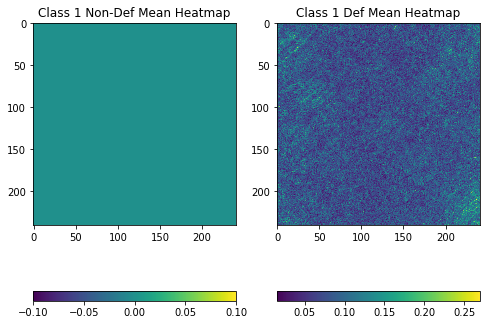

In [81]:
fig = plt.figure(figsize = (8,8))
fig.add_subplot(1, 2, 1)
plt.title("Class 1 Non-Def Mean Heatmap")
imgplot = plt.imshow(euclidean_distance_non_defect_one)
plt.colorbar(orientation='horizontal')
fig.add_subplot(1, 2, 2)
plt.title("Class 1 Def Mean Heatmap")
imgplot = plt.imshow(euclidean_distance_defect_one)
plt.colorbar(orientation='horizontal')

In [82]:
#print(mean_seven)
#print(prediction_non_defect_seven[0])

print("Non Defect:")
euclidean_distance_non_defect_one_example = elementwise_cdist(model_one_prototype_mean_one, prediction_non_defect_one[0])
# print(euclidean_distance_non_defect_one_example.shape)
# print(euclidean_distance_non_defect_one_example)
# print(np.max(euclidean_distance_non_defect_one_example))

print("\nDefect:")
euclidean_distance_defect_one_example = elementwise_cdist(model_one_prototype_mean_one, prediction_defect_one[0])
# print(euclidean_distance_defect_one_example.shape)
# print(euclidean_distance_defect_one_example)
# print(np.max(euclidean_distance_defect_one_example))

Non Defect:

Defect:


Text(0.5, 1.0, 'Class 1 Non-Defective Ex 1')

Text(0.5, 1.0, 'Class 1 Non-Defective Ex 1 Heatmap')

Text(0.5, 1.0, 'Class 1 Defective Ex 1')

Text(0.5, 1.0, 'Class 1 Defective Ex 1 Heatmap')

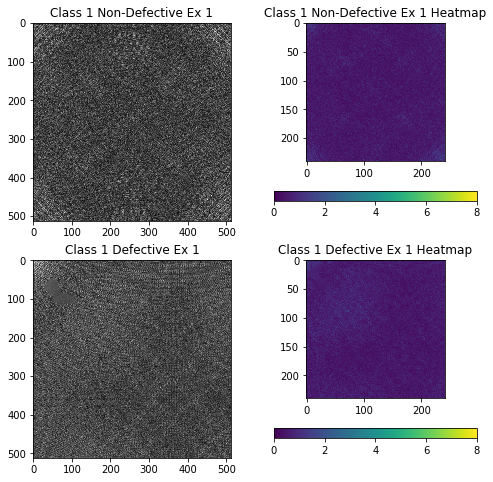

In [83]:
fig = plt.figure(figsize = (8,8))

fig.add_subplot(2, 2, 1)
plt.title("Class 1 Non-Defective Ex 1")
imgplot = plt.imshow(prototype_dagm_one_normalized[0][:,:,0], cmap = "gray")
fig.add_subplot(2, 2, 2)
plt.title("Class 1 Non-Defective Ex 1 Heatmap")
imgplot = plt.imshow(euclidean_distance_non_defect_one_example, vmin=0, vmax=8)
plt.colorbar(orientation='horizontal')

fig.add_subplot(2, 2, 3)
plt.title("Class 1 Defective Ex 1")
imgplot = plt.imshow(testing_one[0][:,:,0], cmap = "gray")
fig.add_subplot(2, 2, 4)
plt.title("Class 1 Defective Ex 1 Heatmap")
imgplot = plt.imshow(euclidean_distance_defect_one_example, vmin=0, vmax=8)
plt.colorbar(orientation='horizontal')

#### Threshold

##### Class 1

In [8]:
auc_curve_and_score(model_one_prototype_mean_one, prediction_non_defect_one, prediction_defect_one, 2.5)

##### Class 2

In [9]:
auc_curve_and_score(model_one_prototype_mean_two, prediction_non_defect_two, prediction_defect_two, 3.45)

#### Class 3

No handles with labels found to put in legend.


True Negatives: 500
False Negatives: 0
True Positives: 150
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


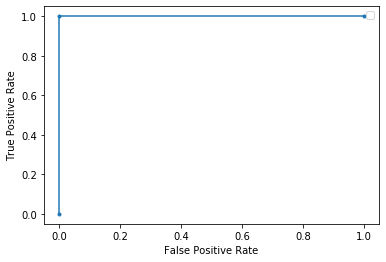

In [74]:
auc_curve_and_score(model_one_prototype_mean_three, prediction_non_defect_three, prediction_defect_three, 3)

#### Class 4

No handles with labels found to put in legend.


True Negatives: 449
False Negatives: 51
True Positives: 113
False Positives: 37

True Positive Rate: 0.6890243902439024
False Positive Rate: 0.07613168724279835

auc score: 0.8064463515005519


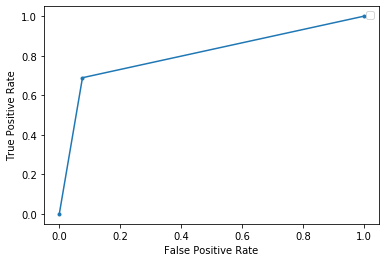

In [77]:
auc_curve_and_score(model_one_prototype_mean_four, prediction_non_defect_four, prediction_defect_four, 2.9)

#### Class 5

No handles with labels found to put in legend.


True Negatives: 497
False Negatives: 3
True Positives: 2
False Positives: 148

True Positive Rate: 0.4
False Positive Rate: 0.22945736434108527

auc score: 0.5852713178294573


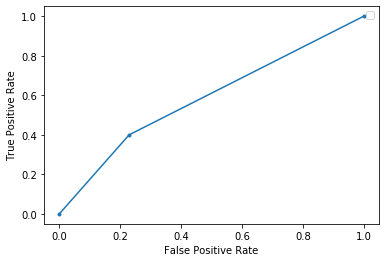

In [82]:
auc_curve_and_score(model_one_prototype_mean_five, prediction_non_defect_five, prediction_defect_five, 2.64)

#### Class 6

No handles with labels found to put in legend.


True Negatives: 498
False Negatives: 2
True Positives: 0
False Positives: 150

True Positive Rate: 0.0
False Positive Rate: 0.23148148148148148

auc score: 0.38425925925925924


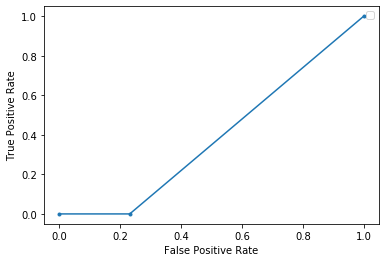

In [76]:
auc_curve_and_score(model_one_prototype_mean_six, prediction_non_defect_six, prediction_defect_six, 6.5)

#### Class 7

No handles with labels found to put in legend.


True Negatives: 89
False Negatives: 11
True Positives: 100
False Positives: 0

True Positive Rate: 0.9009009009009009
False Positive Rate: 0.0

auc score: 0.9504504504504505


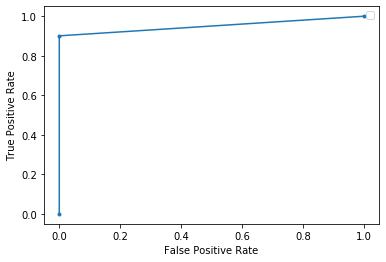

In [114]:
auc_curve_and_score(model_one_prototype_mean_seven, prediction_non_defect_seven, prediction_defect_seven, 2.5)

#### Class 8

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


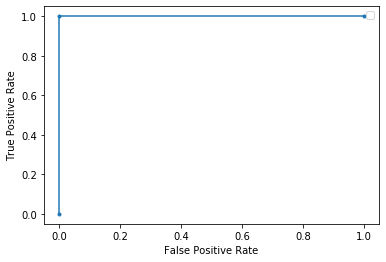

In [118]:
auc_curve_and_score(model_one_prototype_mean_eight, prediction_non_defect_eight, prediction_defect_eight, 2.6)

#### Class 9

No handles with labels found to put in legend.


True Negatives: 96
False Negatives: 4
True Positives: 0
False Positives: 100

True Positive Rate: 0.0
False Positive Rate: 0.5102040816326531

auc score: 0.24489795918367346


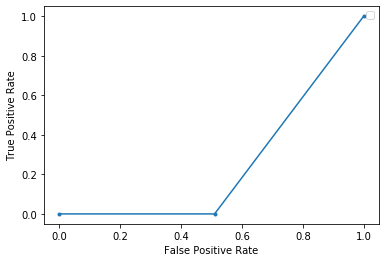

In [131]:
auc_curve_and_score(model_one_prototype_mean_nine, prediction_non_defect_nine, prediction_defect_nine, 3.2)

#### Class 10

No handles with labels found to put in legend.


True Negatives: 99
False Negatives: 1
True Positives: 97
False Positives: 3

True Positive Rate: 0.9897959183673469
False Positive Rate: 0.029411764705882353

auc score: 0.9801920768307324


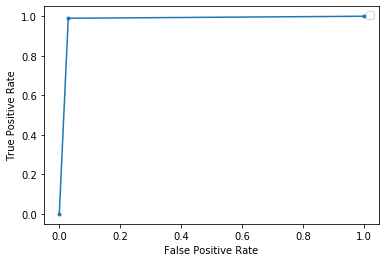

In [137]:
auc_curve_and_score(model_one_prototype_mean_ten, prediction_non_defect_ten, prediction_defect_ten, 2.3)

#### Model 2 Testing

In [82]:
# np.random.seed(0)
# tf.random.set_seed(0)
testing_inp = Input((512,512,1)) 
testing_outp = embedding_model(16, testing_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

testing_model_two = Model(inputs=testing_inp, outputs=testing_outp)
testing_model_two.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_25 (Conv2D)              (None, 506, 506, 16) 800         input_4[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_4 (MaxPooling2D)  (None, 253, 253, 16) 0           conv2d_25[0][0]                  
__________________________________________________________________________________________________
conv2d_26 (Conv2D)              (None, 249, 249, 16) 6416        max_pooling2d_4[0][0]            
____________________________________________________________________________________________

In [83]:
testing_model_two.load_weights('../Models/model_two_weights_custom_loss.h5', by_name="True")

In [84]:
prediction_non_defect_one = prediction_one
prediction_non_defect_two = prediction_two
prediction_non_defect_three = prediction_three
prediction_non_defect_four = prediction_four
prediction_non_defect_five = prediction_five
prediction_non_defect_six = prediction_six

In [144]:
prediction_non_defect_seven = prediction_seven
prediction_non_defect_eight = prediction_eight
prediction_non_defect_nine = prediction_nine
prediction_non_defect_ten = prediction_ten

In [85]:
# prediction_defect_one = testing_model_two.predict([testing_one[0:100]])
# prediction_defect_two = testing_model_two.predict([testing_two[0:100]])
# prediction_defect_three = testing_model_two.predict([testing_three[0:100]])
# prediction_defect_four = testing_model_two.predict([testing_four[0:100]])
# prediction_defect_five = testing_model_two.predict([testing_five[0:100]])
# prediction_defect_six = testing_model_two.predict([testing_six[0:100]])

prediction_defect_one = testing_model_two.predict([testing_one])
prediction_defect_two = testing_model_two.predict([testing_two])
prediction_defect_three = testing_model_two.predict([testing_three])
prediction_defect_four = testing_model_two.predict([testing_four])
prediction_defect_five = testing_model_two.predict([testing_five])
prediction_defect_six = testing_model_two.predict([testing_six])

In [145]:
prediction_defect_seven = testing_model_two.predict([x_dagm_competition_defective_seven_normalized[0:100]])
prediction_defect_eight = testing_model_two.predict([x_dagm_competition_defective_eight_normalized[0:100]])
prediction_defect_nine = testing_model_two.predict([x_dagm_competition_defective_nine_normalized[0:100]])
prediction_defect_ten = testing_model_two.predict([x_dagm_competition_defective_ten_normalized[0:100]])

In [86]:
model_two_mean_non_defect_one, model_two_mean_defect_one = testing_mean_and_max(prediction_non_defect_one, prediction_defect_one)
model_two_mean_non_defect_two, model_two_mean_defect_two = testing_mean_and_max(prediction_non_defect_two, prediction_defect_two)
model_two_mean_non_defect_three, model_two_mean_defect_three = testing_mean_and_max(prediction_non_defect_three, prediction_defect_three)
model_two_mean_non_defect_four, model_two_mean_defect_four = testing_mean_and_max(prediction_non_defect_four, prediction_defect_four)
model_two_mean_non_defect_five, model_two_mean_defect_five = testing_mean_and_max(prediction_non_defect_five, prediction_defect_five)
model_two_mean_non_defect_six, model_two_mean_defect_six = testing_mean_and_max(prediction_non_defect_six, prediction_defect_six)

Max Mean Non Defect: 0.7250131
Max Mean Defect: 0.6701808


#### Threshold

##### Class 1

No handles with labels found to put in legend.


True Negatives: 497
False Negatives: 3
True Positives: 150
False Positives: 0

True Positive Rate: 0.9803921568627451
False Positive Rate: 0.0

auc score: 0.9901960784313726


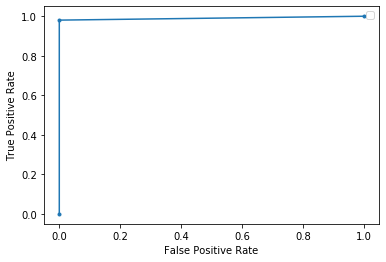

In [97]:
auc_curve_and_score(model_two_prototype_mean_one, prediction_non_defect_one, prediction_defect_one, 4.8)
#100 samples threshold: 3.7

##### Class 2

No handles with labels found to put in legend.


True Negatives: 489
False Negatives: 11
True Positives: 142
False Positives: 8

True Positive Rate: 0.9281045751633987
False Positive Rate: 0.01609657947686117

auc score: 0.9560039978432687


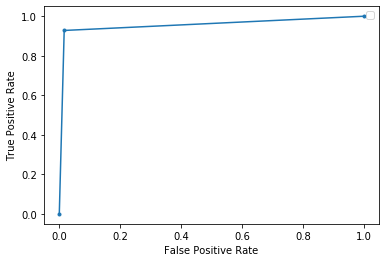

In [121]:
auc_curve_and_score(model_two_prototype_mean_two, prediction_non_defect_two, prediction_defect_two, 4.5)
#100 samples threshold: 3.65

#### Class 3

No handles with labels found to put in legend.


True Negatives: 500
False Negatives: 0
True Positives: 150
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


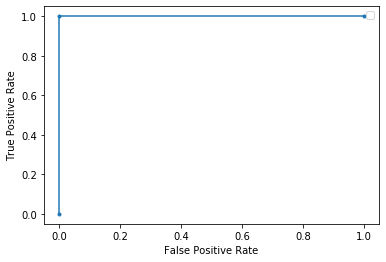

In [88]:
auc_curve_and_score(model_two_prototype_mean_three, prediction_non_defect_three, prediction_defect_three, 3)
#100 samples threshold: 3

#### Class 4

No handles with labels found to put in legend.


True Negatives: 500
False Negatives: 0
True Positives: 150
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


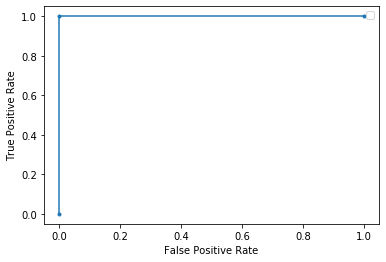

In [88]:
auc_curve_and_score(model_two_prototype_mean_four, prediction_non_defect_four, prediction_defect_four, 3.2)
#100 samples threshold: 3.2

#### Class 5

No handles with labels found to put in legend.


True Negatives: 498
False Negatives: 2
True Positives: 150
False Positives: 0

True Positive Rate: 0.9868421052631579
False Positive Rate: 0.0

auc score: 0.993421052631579


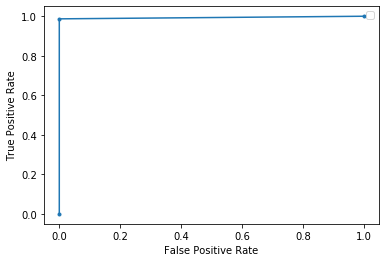

In [96]:
auc_curve_and_score(model_two_prototype_mean_five, prediction_non_defect_five, prediction_defect_five, 1.9)
#100 samples threshold: 3

#### Class 6

No handles with labels found to put in legend.


True Negatives: 499
False Negatives: 1
True Positives: 116
False Positives: 34

True Positive Rate: 0.9914529914529915
False Positive Rate: 0.06378986866791744

auc score: 0.963831561392537


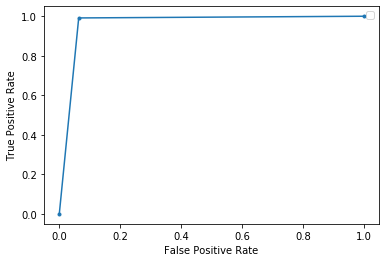

In [97]:
auc_curve_and_score(model_two_prototype_mean_six, prediction_non_defect_six, prediction_defect_six, 3.82)
#100 samples threshold

#### Class 7

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


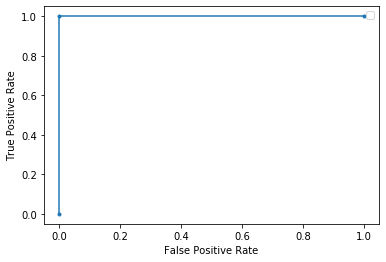

In [148]:
auc_curve_and_score(model_two_prototype_mean_seven, prediction_non_defect_seven, prediction_defect_seven, 3)

#### Class 8

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


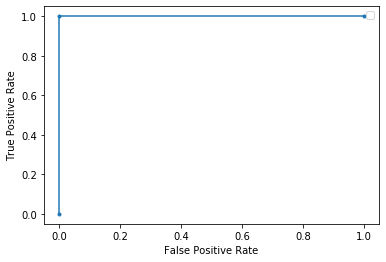

In [150]:
auc_curve_and_score(model_two_prototype_mean_eight, prediction_non_defect_eight, prediction_defect_eight, 3.2)

#### Class 9

No handles with labels found to put in legend.


True Negatives: 99
False Negatives: 1
True Positives: 94
False Positives: 6

True Positive Rate: 0.9894736842105263
False Positive Rate: 0.05714285714285714

auc score: 0.9661654135338346


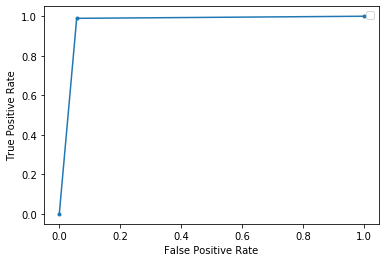

In [155]:
auc_curve_and_score(model_two_prototype_mean_nine, prediction_non_defect_nine, prediction_defect_nine, 3.1)

#### Class 10

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


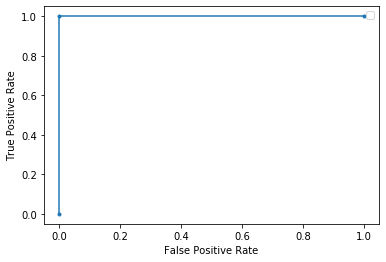

In [160]:
auc_curve_and_score(model_two_prototype_mean_ten, prediction_non_defect_ten, prediction_defect_ten, 2.7)

#### Model 3 Testing

In [69]:
# np.random.seed(0)
# tf.random.set_seed(0)
testing_inp = Input((512,512,1)) 
testing_outp = embedding_model(32, testing_inp) #outp will be the output of the embedding_model we created in building the residual-based cnn

testing_model_three = Model(inputs=testing_inp, outputs=testing_outp)
testing_model_three.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 512, 512, 1)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 506, 506, 16) 800         input_2[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_2 (MaxPooling2D)  (None, 253, 253, 16) 0           conv2d_9[0][0]                   
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 249, 249, 16) 6416        max_pooling2d_2[0][0]            
____________________________________________________________________________________________

In [70]:
testing_model_three.load_weights('../Models/model_three_weights_custom_loss.h5', by_name="True")

In [71]:
prediction_non_defect_one = prediction_one
prediction_non_defect_two = prediction_two
prediction_non_defect_three = prediction_three
prediction_non_defect_four = prediction_four
prediction_non_defect_five = prediction_five
prediction_non_defect_six = prediction_six

In [73]:
prediction_defect_one = testing_model_three.predict([testing_one[0:100]])
prediction_defect_two = testing_model_three.predict([testing_two[0:100]])
prediction_defect_three = testing_model_three.predict([testing_three[0:100]])
prediction_defect_four = testing_model_three.predict([testing_four[0:100]])
prediction_defect_five = testing_model_three.predict([testing_five[0:100]])
prediction_defect_six = testing_model_three.predict([testing_six[0:100]])

In [74]:
model_three_mean_non_defect_one, model_three_mean_defect_one = testing_mean_and_max(prediction_non_defect_one, prediction_defect_one)
model_three_mean_non_defect_two, model_three_mean_defect_two = testing_mean_and_max(prediction_non_defect_two, prediction_defect_two)
model_three_mean_non_defect_three, model_three_mean_defect_three = testing_mean_and_max(prediction_non_defect_three, prediction_defect_three)
model_three_mean_non_defect_four, model_three_mean_defect_four = testing_mean_and_max(prediction_non_defect_four, prediction_defect_four)
model_three_mean_non_defect_five, model_three_mean_defect_five = testing_mean_and_max(prediction_non_defect_five, prediction_defect_five)
model_three_mean_non_defect_six, model_three_mean_defect_six = testing_mean_and_max(prediction_non_defect_six, prediction_defect_six)

Max Mean Non Defect: 1.3513836
Max Mean Defect: 0.73989594
Max Mean Non Defect: 0.632335
Max Mean Defect: 0.73039794
Max Mean Non Defect: 1.8656414
Max Mean Defect: 0.6770082
Max Mean Non Defect: 1.826141
Max Mean Defect: 0.48279092
Max Mean Non Defect: 1.3631356
Max Mean Defect: 0.48753536
Max Mean Non Defect: 1.2845563
Max Mean Defect: 0.7306416


#### Threshold

##### Class 1

No handles with labels found to put in legend.


True Negatives: 97
False Negatives: 3
True Positives: 99
False Positives: 1

True Positive Rate: 0.9705882352941176
False Positive Rate: 0.01020408163265306

auc score: 0.9801920768307324


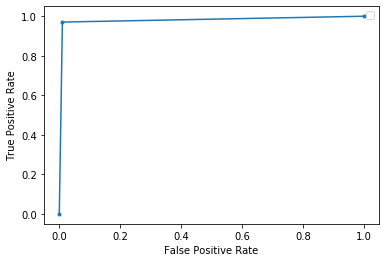

In [85]:
auc_curve_and_score(model_three_prototype_mean_one, prediction_non_defect_one, prediction_defect_one, 3.7)

##### Class 2

No handles with labels found to put in legend.


True Negatives: 65
False Negatives: 35
True Positives: 95
False Positives: 5

True Positive Rate: 0.7307692307692307
False Positive Rate: 0.07142857142857142

auc score: 0.8296703296703297


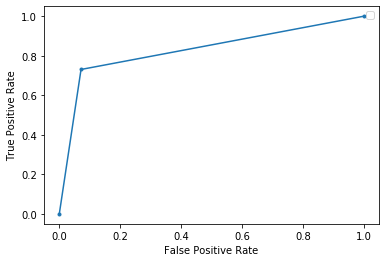

In [90]:
auc_curve_and_score(model_three_prototype_mean_two, prediction_non_defect_two, prediction_defect_two, 3.65)

#### Class 3

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


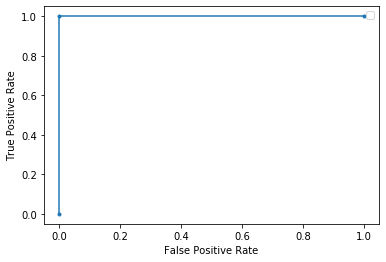

In [92]:
auc_curve_and_score(model_three_prototype_mean_three, prediction_non_defect_three, prediction_defect_three, 3)

#### Class 4

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


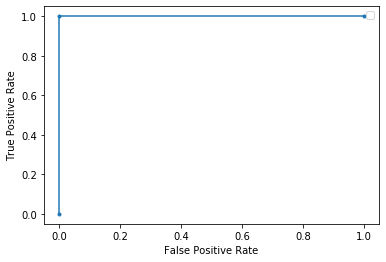

In [96]:
auc_curve_and_score(model_three_prototype_mean_four, prediction_non_defect_four, prediction_defect_four, 3.2)

#### Class 5

No handles with labels found to put in legend.


True Negatives: 100
False Negatives: 0
True Positives: 100
False Positives: 0

True Positive Rate: 1.0
False Positive Rate: 0.0

auc score: 1.0


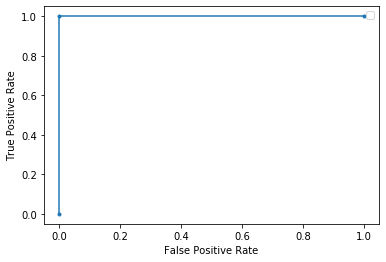

In [100]:
auc_curve_and_score(model_three_prototype_mean_five, prediction_non_defect_five, prediction_defect_five, 3)

#### Class 6

No handles with labels found to put in legend.


True Negatives: 3
False Negatives: 97
True Positives: 99
False Positives: 1

True Positive Rate: 0.5051020408163265
False Positive Rate: 0.25

auc score: 0.6275510204081632


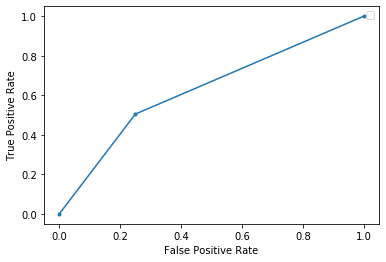

In [111]:
auc_curve_and_score(model_three_prototype_mean_six, prediction_non_defect_six, prediction_defect_six, 4.9)